In [85]:
import pandas as pd
import glob
import os
import numpy as np
import datetime
import matplotlib.pyplot as plt
import calendar
import scipy
from scipy import interpolate
from scipy.stats import ttest_ind
import statsmodels.api as sm
import cartopy.crs as crs
import cartopy.feature as cfeature
import seaborn as sns
import random

# How to Gather the Data

The Zillow data sets come from [here](https://www.zillow.com/research/data/). Go under the 'Home values' section and in the drop down select 'ZHVI 1-Bedroom Time Series' and do the same for 2, 3, and 4 bedroom and also get 'ZHVI Condo/Co-op Time Series' under the 'Data Type' drop down. Then, for each of the 5 selections, select 'County' under the 'Geography' drop down.<br>
Then, go [here](https://www.census.gov/data/datasets/time-series/demo/popest/2010s-total-housing-units.html) to get the U.S. Census Bureau Housing Unit data set. Scroll down until you see 'Annual Estimates of County Housing Units for States: 2010 to 2019' and then under this header click on 'United States' and the file will download.<br>
Lastly, go to [here](https://www.census.gov/data/datasets/time-series/demo/popest/2010s-counties-detail.html) to grab the U.S. Census Bureau demographics and population data set. Scroll down until you see the header 'Annual County Resident Population Estimates by Age, Sex, Race, and Hispanic Origin: April 1, 2010 to July 1, 2019 (CC-EST2019-ALLDATA). Under this header click on 'United States' and the data file will download.<br>
To get the file used for longitude and latitude of each county, go [here](https://www.census.gov/geographies/reference-files/time-series/geo/gazetteer-files.html) and scroll down until you see the 'County' header then click the link under that header and the file will downloade.<br>
Lastly, there was Zillow renter data liste under the project proposal, but after further inspection, I found out that this data file didn't have data for enough counties, so I ended up doing this project without that data file.<br>
If you save the downloaded files (a total of 8) under a 'Data' folder in the same directory as this notebook, then this notebook should work for you. The spatial file should be saved in a folder named 'Census_Bureau'.

All metadata for the data can be found on the respective data links as well.

# Data Cleaning

In [3]:
directory = os.getcwd()

In [4]:
#get the file path for each data file
csv_files = glob.glob(directory+'/Data/**/*.csv',recursive=True)
xlsx_files = glob.glob(directory+'/Data/**/*.xlsx',recursive=True)

In [5]:
csv_files

['C:\\Users\\david\\Desktop\\UMBC\\DATA601\\Projects\\Project 3/Data\\Census_Bureau\\cc-est2019-alldata.csv',
 'C:\\Users\\david\\Desktop\\UMBC\\DATA601\\Projects\\Project 3/Data\\Zillow\\Buyer\\County_zhvi_bdrmcnt_1_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv',
 'C:\\Users\\david\\Desktop\\UMBC\\DATA601\\Projects\\Project 3/Data\\Zillow\\Buyer\\County_zhvi_bdrmcnt_2_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv',
 'C:\\Users\\david\\Desktop\\UMBC\\DATA601\\Projects\\Project 3/Data\\Zillow\\Buyer\\County_zhvi_bdrmcnt_3_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv',
 'C:\\Users\\david\\Desktop\\UMBC\\DATA601\\Projects\\Project 3/Data\\Zillow\\Buyer\\County_zhvi_bdrmcnt_4_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv',
 'C:\\Users\\david\\Desktop\\UMBC\\DATA601\\Projects\\Project 3/Data\\Zillow\\Buyer\\County_zhvi_uc_condo_tier_0.33_0.67_sm_sa_mon.csv']

In [6]:
xlsx_files

['C:\\Users\\david\\Desktop\\UMBC\\DATA601\\Projects\\Project 3/Data\\Census_Bureau\\CO-EST2019-ANNHU.xlsx']

In [7]:
#reading and loading each file as a dataframe and appending it to a list - if the file isn't utf-8 encoded then its ansi
data_frames = []
for csv in csv_files:
    print(csv)
    try:
        data_frames.append(pd.read_csv(csv,encoding='utf-8'))
    except:
        data_frames.append(pd.read_csv(csv,encoding='ansi'))
for xlsx in xlsx_files:
    print(xlsx)
    data_frames.append(pd.read_excel(xlsx))

C:\Users\david\Desktop\UMBC\DATA601\Projects\Project 3/Data\Census_Bureau\cc-est2019-alldata.csv
C:\Users\david\Desktop\UMBC\DATA601\Projects\Project 3/Data\Zillow\Buyer\County_zhvi_bdrmcnt_1_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv
C:\Users\david\Desktop\UMBC\DATA601\Projects\Project 3/Data\Zillow\Buyer\County_zhvi_bdrmcnt_2_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv
C:\Users\david\Desktop\UMBC\DATA601\Projects\Project 3/Data\Zillow\Buyer\County_zhvi_bdrmcnt_3_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv
C:\Users\david\Desktop\UMBC\DATA601\Projects\Project 3/Data\Zillow\Buyer\County_zhvi_bdrmcnt_4_uc_sfrcondo_tier_0.33_0.67_sm_sa_mon.csv
C:\Users\david\Desktop\UMBC\DATA601\Projects\Project 3/Data\Zillow\Buyer\County_zhvi_uc_condo_tier_0.33_0.67_sm_sa_mon.csv
C:\Users\david\Desktop\UMBC\DATA601\Projects\Project 3/Data\Census_Bureau\CO-EST2019-ANNHU.xlsx


There will be a lot of cleaning on the data frames to make them compatible for merging.

First of all, I want to visualize the different date ranges available with the different data sets to see what the overlap is.

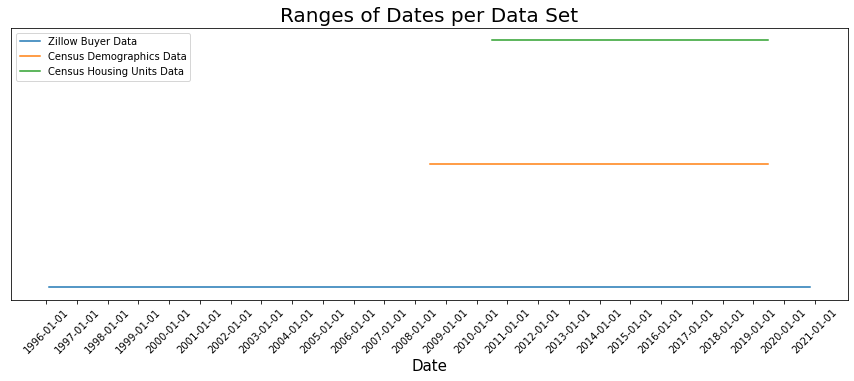

In [8]:
zillow_buyer_columns = data_frames[1].columns
#YEAR is currently just numbers that aren't the years
census_demo_years = np.unique([2020]*data_frames[0].shape[0] - data_frames[0]['YEAR'])
census_units_years = range(2010,2020,1)

census_units_dates = []
for year in census_units_years:
    #estimates in this file are evaluated as of July 1st - however, to make more compatible with the zillow data, I will 
    #make the evaluation dates June 30th
    census_units_dates.append(datetime.datetime(year,6,30))
    
census_demo_dates = []
for year in census_demo_years:
    #Since these are estimates of population for a given year, I think it may be more appropriate to have the dates be the
    #middle of the year for each year of data because the middle of the year should reflect the average population for that year
    census_demo_dates.append(datetime.datetime(year,6,30))
#formatting the dates    
zillow_buyer_dates = list(zillow_buyer_columns)[9:]
zillow_buyer_dates = [datetime.datetime.strptime(buyer_date,'%Y-%m-%d') for buyer_date in zillow_buyer_dates]

#plotting the dates to see what the overlaps are
plt.figure(figsize=(15,5))
plt.plot(zillow_buyer_dates,[1]*len(zillow_buyer_dates),label='Zillow Buyer Data')
plt.plot(census_demo_dates,[1.5]*len(census_demo_dates),label='Census Demographics Data')
plt.plot(census_units_dates,[2]*len(census_units_dates),label='Census Housing Units Data')
plt.xticks([datetime.date(year,1,1) for year in range(1996,2022)],rotation=45)
plt.xlabel('Date',fontsize=15)
plt.yticks([])
plt.title('Ranges of Dates per Data Set',fontsize=20)
plt.legend()

The only range of overlap in dates is from June 30th 2010 through June 30th 2019.

In [9]:
#creating variables to use as reference for when data sets should start and end
low_range = datetime.datetime(2010,6,30)
high_range = datetime.datetime(2019,6,30)

### Now I need to format each of the dataframes before merging them all together

Start with the Zillow buyer data sets

In [10]:
#sort through the date columns and delete the ones out of range
#starting with the zillow buyer data frames
dates = list(zillow_buyer_columns)
dates[9:] = zillow_buyer_dates
for i in range(1,6):
    data_frames[i].columns = dates
    for row in list(data_frames[i].columns):
        try:
            if row < low_range or row > high_range:
                del data_frames[i][row]
        except:
            continue

In [11]:
#now to do the same thing for the housing units data
data_frames[6] = data_frames[6].drop([0,1,2])
data_frames[6] = data_frames[6].reset_index(drop=True)
units_columns = ['Geographic Area','Census','Base Estimate'] + census_units_dates
data_frames[6].columns = units_columns

for row in list(data_frames[6].columns):
    try:
        if row < low_range or row > high_range:
            del data_frames[6][row]
    except:
        continue

In [12]:
#lastly, I must do this for the census demographics dataset
#first, I need to create a mapping for changing year from 1-12 to the actual years (2008 through 2020)
print('Current Unique Values for the Year Column are:')
print(np.unique(data_frames[0]['YEAR']))
year_mapping = dict(zip(np.unique(data_frames[0]['YEAR']),census_demo_dates))
new_year = [year_mapping[year] for year in data_frames[0]['YEAR']]
data_frames[0]['YEAR'] = new_year

Current Unique Values for the Year Column are:
[ 1  2  3  4  5  6  7  8  9 10 11 12]


## Now I will work to merge all these data files together

In [13]:
#starting out with the zillow buyer data sets - I first need to create a column for the merge to match on

for i in range(1,6):
    data_frames[i]['County and State'] = [data_frames[i]['RegionName'][j]+', '+data_frames[i]['StateName'][j] for j in range(data_frames[i].shape[0])]
    
#I don't need all of these columns in each of the zillow buyer data sets
to_delete = ['RegionID','SizeRank','RegionName','RegionType','StateName','State','Metro','StateCodeFIPS','MunicipalCodeFIPS']
for item in to_delete:
    for i in range(1,6):
        del data_frames[i][item]

In [14]:
#now i need to 'melt' the dataframes becuase the dates are columns, but they should be melted into one date column
id_vars = ['County and State']
new_frames = []
value_names = ['1BR ZHVI','2BR ZHVI','3BR ZHVI','4BR ZHVI','Condo ZHVI']
for i in range(1,6):
    new_frames.append(pd.melt(data_frames[i].copy(),id_vars,var_name = 'Date',value_name=value_names[i-1]))

In [15]:
#now for a sanity check I want to see how many total unique counties there are
all_counties = []
for i in range(1,6):
    all_counties += list(new_frames[i-1]['County and State'])
    
print('There are '+str(len(np.unique(all_counties))) + ' unique counties in the zillow buyers data sets')

There are 2856 unique counties in the zillow buyers data sets


In [16]:
#to do a sanity check, I want to see how many rows are in each of the zillow buyer data_frames to see how reasonable the
#above number sounds
for i in range(1,6):
    print(data_frames[i].shape)

(2577, 110)
(2823, 110)
(2854, 110)
(2829, 110)
(1647, 110)


This looks roughly correct. The number of unique county and state combinations is 2,856 which is higher than the number of counties in any individual data set, which would tell me that there are some counties represented in specific data sets. I will move forward keeping this in mind.

Now to join the zillow buyer data sets.

In [17]:
#In order to have the uniqueness in a column for merging, I can't only use county and state, but I also need to include the data
# I am including all this information in one column and setting it to be the index
for i in range(5):
    new_frames[i]['joiner'] = [new_frames[i]['County and State'][j]+' '+str(new_frames[i]['Date'][j]) for j in range(new_frames[i].shape[0])]
    new_frames[i].index = new_frames[i]['joiner']
    #this columns below are no longer needed and will only cause lots of duplicated rows after the merging
    del new_frames[i]['joiner']
    del new_frames[i]['County and State']
    del new_frames[i]['Date']
    
#now to finally do the actual merging!!
merged_set = new_frames[0].copy()
for i in range(1,5):
    #I am joining based on the index, and I am doing an outer join since there are counties unique to certain data frames
    merged_set = merged_set.merge(new_frames[i],left_index=True,right_index=True,how='outer')

In [18]:
#now to see how the large the merged set is
merged_set.shape

(311304, 5)

This data frames looks to be the right size. There are 5 columns (1 BR, 2 BR, 3 BR, 4 BR, and Condo) and since there are 9 years of data included, and each year has 12 months, we can multiply 109 (not 108 because the end month of June is included) by the number of unique counties (2,856). I will verify this below.

In [19]:
print(len(np.unique(all_counties))*109)

311304


Now that the Zillow buyers data has been merged together, I need to add in the census bureau data.

In [20]:
#first, the states are spelled out rather than abbreviated so I've brought in a mapping of full state names to abbreviation
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY',
    'United States Minor Outlying Islands':'Outlying Islands',
    'United States Virgin Islands':'Virgin Islands'
}

In [21]:
#there are periods in front of the county names so these need to be removed
#also I need to replace the full state name with the abbreviations
counties = ['']
states = ['']
for i in range(1,data_frames[6].shape[0]):
    split = data_frames[6]['Geographic Area'][i].split(',')
    if len(split) == 2 and len(split[0])>=1 and len(split[1])>=1:
        counties.append(split[0][1:])
        try:
            states.append(us_state_abbrev[split[1][1:]])
        except:
            states.append('')
    else:
        counties.append('')
        states.append('')
data_frames[6]['County'] = counties
data_frames[6]['State'] = states

In [22]:
data_frames[6]['County and State'] = [data_frames[6]['County'][j]+', '+data_frames[6]['State'][j] for j in range(data_frames[6].shape[0])]

In [23]:
#I want to check to make sure each county in the merged zillow buyer data set is actually contained in the housing units dataset
#so I will create a column that is the extracted out county and state (the data is always the last 19 characters plus a divider space)
merged_set['Unique County State'] = merged_set.index.str[:-20]

In [24]:
#now to check which counties don't have a match in the census bureau housing units data set
zillow_counties = []
for county in np.unique(merged_set['Unique County State']):
    if not(county in list(data_frames[6]['County and State'])):
        zillow_counties.append(county)
zillow_counties

['Alexandria City, VA',
 'Anchorage Borough, AK',
 'Baltimore City, MD',
 'Bristol City, VA',
 'Buena Vista City, VA',
 'Charlottesville City, VA',
 'Chesapeake City, VA',
 'Colonial Heights City, VA',
 'Covington City, VA',
 'Danville City, VA',
 'De Kalb County, AL',
 'De Kalb County, IN',
 'De Soto County, FL',
 'De Witt County, TX',
 'Dekalb County, GA',
 'Dekalb County, TN',
 'Dewitt County, IL',
 'Dona Ana County, NM',
 'Emporia City, VA',
 'Fairfax City, VA',
 'Falls Church City, VA',
 'Franklin City, VA',
 'Fredericksburg City, VA',
 'Galax City, VA',
 'Hampton City, VA',
 'Harrisonburg City, VA',
 'Hopewell City, VA',
 'Juneau Borough, AK',
 'La Porte County, IN',
 'La Salle County, IL',
 'Lac Qui Parle County, MN',
 'Lagrange County, IN',
 'LeFlore County, OK',
 'Lexington City, VA',
 'Lynchburg City, VA',
 'Manassas City, VA',
 'Manassas Park City, VA',
 'Martinsville City, VA',
 'Matanuska Susitna Borough, AK',
 'Newport News City, VA',
 'Norfolk City, VA',
 'Norton City, V

Woooo!! I love dealing with inconsistent abbreviations and spelling! Time for some string replacements.

In [25]:
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Anchorage Municipality','Anchorage Borough',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace(' city',' City',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('DeKalb','De Kalb',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('DeSoto','De Soto',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('DeWitt','De Witt',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Doña','Dona',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Juneau City and Borough','Juneau Borough',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Lac qui','Lac Qui',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Matanuska-Susitna','Matanuska Susitna',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('St. ','Saint ',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Ste. ','Sainte ',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Sitka City and Borough','Sitka Borough',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Valdez-Cordova Census Area','Valdez Cordova Borough',regex=True)
data_frames[6]['County and State'] = data_frames[6]['County and State'].replace('Wrangell City and Borough','Wrangell Borough',regex=True)

In [26]:
merged_set['Unique County State'] = merged_set['Unique County State'].replace('Dekalb','De Kalb',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('Dewitt','De Witt',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('La ','La',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('LaCrosse','La Crosse',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('LaPaz','La Paz',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('LaPlata','La Plata',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('Lagrange','LaGrange',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('LeFlore','Leflore',regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('O Brien',"O'Brien",regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('Prince Georges',"Prince George's",regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('Queen Annes',"Queen Anne's",regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('Saint Marys',"Saint Mary's",regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('Leflore County, OK','Le Flore County, OK',regex=True)

In [27]:
merged_set['Unique County State'] = merged_set['Unique County State'].replace('DeSoto County, MS',"De Soto County, MS",regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('DeKalb County, MO',"De Kalb County, MO",regex=True)
merged_set['Unique County State'] = merged_set['Unique County State'].replace('DeKalb County, IL',"De Kalb County, IL",regex=True)

In [28]:
#make sure there is a match for every needed county
for county in np.unique(merged_set['Unique County State']):
    if not(county in list(data_frames[6]['County and State'])):
        print(county)

Since nothing was printed in the cell above, that means there is a now a match for every county - time to merge - but first I need to melt the Date into its own column

In [29]:
#before I do a dataframe melt, I'm going to get rid of a few columns
to_delete = ['Geographic Area','Census','Base Estimate','County','State']
for item in to_delete:
    del data_frames[6][item]

In [33]:
#time to melt the data set so it can be merged with the zillow dataset
units_data = pd.melt(data_frames[6].copy(),['County and State'],var_name = 'Date',value_name='Home Units')

In [34]:
units_data.tail(10)

,County and State,Date,Home Units
31480,"Teton County, WY",2019-06-30,14186
31481,"Uinta County, WY",2019-06-30,9108
31482,"Washakie County, WY",2019-06-30,3868
31483,"Weston County, WY",2019-06-30,3568
31484,",",2019-06-30,NaN
31485,",",2019-06-30,NaN
31486,",",2019-06-30,NaN
31487,",",2019-06-30,NaN
31488,"ource: U.S. Census Bureau,",2019-06-30,NaN
31489,",",2019-06-30,NaN


In [35]:
#the bottom of the dataframe has some rubbish in it (notes from file)
units_data = units_data.drop(range(31484,31490))
units_data = units_data.reset_index(drop=True)

In [36]:
#now to set the index to the combination of county, state, and data
units_data.index = [units_data['County and State'][i]+' '+str(units_data['Date'][i]) for i in range(units_data.shape[0])]

In [37]:
#now time to actually merge them
#I'm doing a left join because there are some counties in the housing units data set that aren't in the zillow buyer sets
#and since this housing units data supplements the housing price index data, those extra counties aren't needed
merged_set2 = merged_set.copy().merge(units_data,left_index=True,right_index=True,how='left')

### Now it's time to merge the last file (the BIG one!)

In [38]:
#starting to set up the unique identifier column
data_frames[0]['County and State'] = [data_frames[0]['CTYNAME'][i]+', '+us_state_abbrev[data_frames[0]['STNAME'][i]] for i in range(data_frames[0].shape[0])]

In [39]:
#check to see how the county names match up again
zillow_counties2 = []
for county in np.unique(merged_set2['Unique County State']):
    if not(county in list(data_frames[0]['County and State'])):
        zillow_counties2.append(county)

In [40]:
#now I want to compare the length of the non-matching counties from the last census bureau merge to this one and see if the
#numbers look similar
print("Length of first county mismatch list is "+str(len(zillow_counties2)))
print("Length of this county mismatch list is "+str(len(zillow_counties)))
print("Length of unique counties mismatched between the two lists is "+str(len(np.unique(zillow_counties+zillow_counties2))))

Length of first county mismatch list is 83
Length of this county mismatch list is 88
Length of unique counties mismatched between the two lists is 94


It looks like there is a lot of overlap between the mismatches here and in the last census bureau data set, so I'll apply the same changes and see what it looks like afterward.

In [41]:
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Anchorage Municipality','Anchorage Borough',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace(' city',' City',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('DeKalb','De Kalb',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('DeSoto','De Soto',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('DeWitt','De Witt',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Doña','Dona',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Juneau City and Borough','Juneau Borough',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Lac qui','Lac Qui',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Matanuska-Susitna','Matanuska Susitna',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('St. ','Saint ',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Ste. ','Sainte ',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Sitka City and Borough','Sitka Borough',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Valdez-Cordova Census Area','Valdez Cordova Borough',regex=True)
data_frames[0]['County and State'] = data_frames[0]['County and State'].replace('Wrangell City and Borough','Wrangell Borough',regex=True)

In [42]:
#check to see how the county names match up again
for county in np.unique(merged_set2['Unique County State']):
    if not(county in list(data_frames[0]['County and State'])):
        print(county)

The above line took much longer than I thought to run (BEWARE), but it yielded no mismatches between representations of county names (which would make sense because it is also from the Census Bureau so should be consistent in naming).

In [43]:
#setting the index to the unique identifier
data_frames[0].index = [data_frames[0]['County and State'][i]+' '+str(data_frames[0]['YEAR'][i]) for i in range(data_frames[0].shape[0])]

In [44]:
#only subsetting on the date range listed at the beginning of this file
data_frame0_subset = data_frames[0][(data_frames[0]['YEAR']>=low_range)&(data_frames[0]['YEAR']<=high_range)]

In [45]:
#not all of these columns are needed so I will delete some
to_delete = ['SUMLEV','STATE','COUNTY','STNAME','CTYNAME','County and State','YEAR']
for item in to_delete:
    del data_frame0_subset[item]

Before merging, the age groups need to be split out into columns instead of rows. Otherwise there will be a lot of additional rows added to the grand data set. 

Next, the dataframe is currently organized where the age group and year are set up as rows in the data frame. I want the year to be set up as a row in the data frame, but not the age groups since there are 19 age groups - this makes 19 times as many rows as necessary. Therefore I will rearrange the dataframe so year remains its own column and age gets distributed amongst the other columns (so each column will be repeated 19 times, once for each age group). 

In [46]:
data_frame0_subset['joiner'] = data_frame0_subset.index
#setting up index for the dataframe that distinguishes between unique county/date and age group
condensed = data_frame0_subset.set_index(['joiner','AGEGRP'])

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [47]:
#now I'm unstacking based on AGEGRP so that now the columns are set up as a multi index
condensed = condensed.unstack(['AGEGRP'])

In [48]:
#since the columns are multi indexed, before merging with the main dataset I would like to convert this to single index
new_columns = [str(c[1])+'_'+c[0] for c in list(condensed.columns)]
condensed.columns = new_columns

In [49]:
#now to merge this last dataframe into the main set
#I'm doing a left outer join for the same reason as last time - there are more counties in the condensed dataframe, but only
#the zillow counties are needed
merged_set3 = merged_set2.copy().merge(condensed,left_index=True,right_index=True,how='left')

In [50]:
#I want to quickly check that the number of rows in the final dataframe is the same as it was prior and only the column count changed
print('Shape of dataframe pre-final merge: '+str(merged_set2.shape))
print('Shape of dataframe post-final merge: '+str(merged_set3.shape))

Shape of dataframe pre-final merge: (311304, 9)
Shape of dataframe post-final merge: (311304, 1396)


In [51]:
#these columns need to be deleted before the data set is complete
to_delete = ['County and State','Date']
for item in to_delete:
    del merged_set3[item]

# Now to try to interpolate values for the demographics, populations, and housing units data

In [52]:
#get an idea of what columns need to be interpolated (most of them)
merged_set3.head()

,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI,Condo ZHVI,Unique County State,Home Units,0_TOT_POP,1_TOT_POP,2_TOT_POP,...,9_HNAC_FEMALE,10_HNAC_FEMALE,11_HNAC_FEMALE,12_HNAC_FEMALE,13_HNAC_FEMALE,14_HNAC_FEMALE,15_HNAC_FEMALE,16_HNAC_FEMALE,17_HNAC_FEMALE,18_HNAC_FEMALE
"Abbeville County, SC 2010-06-30 00:00:00",NaN,61557.0,96780.0,130626.0,NaN,"Abbeville County, SC",12083,25328.0,1501.0,1564.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"Abbeville County, SC 2010-07-31 00:00:00",NaN,61322.0,96221.0,129882.0,NaN,"Abbeville County, SC",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Abbeville County, SC 2010-08-31 00:00:00",NaN,61025.0,95759.0,129389.0,NaN,"Abbeville County, SC",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Abbeville County, SC 2010-09-30 00:00:00",NaN,60699.0,95355.0,128829.0,NaN,"Abbeville County, SC",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
"Abbeville County, SC 2010-10-31 00:00:00",NaN,60639.0,95078.0,128652.0,NaN,"Abbeville County, SC",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:
#I need to extract the date from the index
merged_set3['Date'] = pd.to_datetime(merged_set3.index.str[-19:-9],format='%Y-%m-%d')

In [54]:
#I want to change the column name of 'Unique County and State' to 'County and State'
cols = list(merged_set3.columns)
cols[5] = 'County and State'
merged_set3.columns = cols

Now that I have looked at the variables, there is a lot of in depth race population data. I'm sure that there are some relationships between populations of various races and home prices. However, I don't think it is ethical to base an investment decision based on the trends of races living in them. However, I think that using gender and age groups is not unethical so I will get rid of the all the race variables and keep the gender and age groups.

In [55]:
cols = merged_set3.columns

In [56]:
#create the column names for the age groups and genders to keep
to_keep = list(cols[:6])
for age in range(19):
    for group in ['TOT_POP','TOT_MALE','TOT_FEMALE']:
        to_keep.append(str(age)+'_'+group)
to_keep += ['Date','County and State','Home Units']

In [57]:
final_set = merged_set3[to_keep]

In [58]:
#now to create totals by male/female and overall
final_set['Male'] = final_set['0_TOT_MALE']
final_set['Female'] = final_set['0_TOT_FEMALE']
final_set['Total'] = final_set['0_TOT_POP']
for age in range(1,19):
    final_set['Male'] += final_set[str(age)+'_'+'TOT_MALE']
    final_set['Female'] += final_set[str(age)+'_'+'TOT_FEMALE']
    final_set['Total'] += final_set[str(age)+'_'+'TOT_POP']

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = v

In [59]:
#for some reason, County and State is listed twice as a column
del final_set['County and State']
final_set['County and State'] = final_set.index.str[:-20]

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [60]:
#now I need to interpolate the columns with missing values
final_set.isnull().sum()

1BR ZHVI             53316
2BR ZHVI             20331
3BR ZHVI             16979
4BR ZHVI             19605
Condo ZHVI          144136
                     ...  
Home Units          282884
Male                282884
Female              282884
Total               282884
County and State         0
Length: 68, dtype: int64

Text(0, 0.5, 'Units')

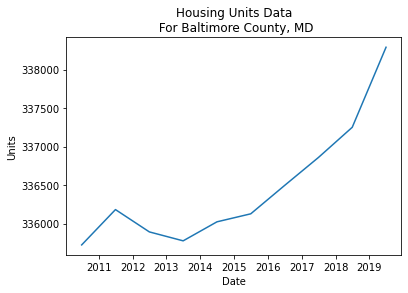

In [61]:
#I would like to use cubic spline to interpolate the missing values because I don't think alot of this data will be linear
#take the below plot for example
county_sub = final_set[final_set['County and State']=='Baltimore County, MD']
plt.plot(county_sub['Date'][np.isfinite(list(county_sub['Home Units']))],county_sub['Home Units'][np.isfinite(list(county_sub['Home Units']))])
plt.title('Housing Units Data\n For Baltimore County, MD')
plt.xlabel('Date')
plt.ylabel('Units')

Text(0, 0.5, 'Units')

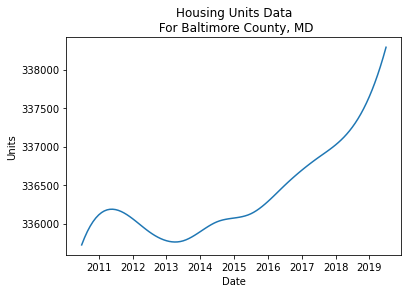

In [62]:
#This plot using cubic splines for interpolation is shown below
interp = 'Home Units'
interpolation = scipy.interpolate.CubicSpline(county_sub['Date'][np.isfinite(list(county_sub[interp]))],county_sub[interp][np.isfinite(list(county_sub[interp]))])
plt.plot(county_sub['Date'],interpolation(county_sub['Date']))
plt.title('Housing Units Data\n For Baltimore County, MD')
plt.xlabel('Date')
plt.ylabel('Units')                                          

From looking at one of the cells far above in this notebook that shows the shape of each of the zillow dataframes, the number of counties in the condo data set is about 1,000 less than the number of counties in the other zillow data sets. It makes the most sense to just delete the condo variable.

In [63]:
del final_set['Condo ZHVI']

Now I'm going to run interpolations on each of the necessary columns. This cell below takes a while.

In [64]:
#now to do the interpolations. This will need to be done at the county level
to_interp = list(final_set.columns)
to_interp.remove('County and State')
to_interp.remove('Date')
not_successful = []
types = []
for i, combo in enumerate(np.unique(final_set['County and State'])):
    if i%10 == 0:
        print(i)
        print(combo)
    subset = final_set[final_set['County and State']==combo]
    for interp in to_interp:
        try:
            #not doing any extrapolation because I think that is a little dangerous with the large amount of interpolations
            #being done already
            interpolation = scipy.interpolate.CubicSpline(subset['Date'][np.isfinite(list(subset[interp]))],subset[interp][np.isfinite(list(subset[interp]))],extrapolate=False)
            final_set.loc[subset.index,interp] = interpolation(subset['Date'])
        except:
            not_successful.append(combo)
            types.append(interp)

0
Abbeville County, SC


C:\Users\david\Anaconda3\lib\site-packages\pandas\core\indexing.py:1743: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(ilocs[0], value)


10
Adams County, ID
20
Addison County, VT
30
Alcona County, MI
40
Alleghany County, NC
50
Alpine County, CA
60
Anderson County, TX
70
Apache County, AZ
80
Arlington County, VA
90
Asotin County, WA
100
Audrain County, MO
110
Bailey County, TX
120
Bandera County, TX
130
Barron County, WI
140
Bath County, KY
150
Beauregard Parish, LA
160
Belknap County, NH
170
Benton County, AR
180
Bergen County, NJ
190
Bibb County, AL
200
Blaine County, OK
210
Bollinger County, MO
220
Boone County, MO
230
Bowie County, TX
240
Branch County, MI
250
Bristol County, MA
260
Broward County, FL
270
Brunswick County, VA
280
Buffalo County, NE
290
Burleson County, TX
300
Butler County, NE
310
Caddo Parish, LA
320
Calhoun County, AR
330
Callaway County, MO
340
Cameron County, PA
350
Cannon County, TN
360
Carlton County, MN
370
Carroll County, MO
380
Carteret County, NC
390
Cass County, ND
400
Cecil County, MD
410
Champaign County, OH
420
Charlton County, GA
430
Chelan County, WA
440
Cherokee County, TX
450
Chicka

In [65]:
#now to see how many unique counties don't have enough data to do any interpolations on
print(str(len(np.unique(not_successful)))+' unique counties were not able to have interpolations done on them')
print(str(len(np.unique(types)))+' unique column names were not able to have interpolations done on them for the various counties')

304 unique counties were not able to have interpolations done on them
65 unique column names were not able to have interpolations done on them for the various counties


Not all of the counties have values for all the variables. And looking at the number of unique variables in the list 'types', just about every variable has this happen for atleast one of the counties. Therefore, I think it makes the most sense to get rid of the counties that have these missing values.

In [66]:
for county_state in np.unique(not_successful):
    subset = final_set[final_set['County and State']==county_state]
    final_set = final_set.drop(subset.index)

In [67]:
#now to see the shape and head and tail of the dataframe with interpolations done on it
print("Shape of interpolated file with problematic counties removed is "+str(final_set.shape))
final_set.head()

Shape of interpolated file with problematic counties removed is (278168, 67)


,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI,0_TOT_POP,0_TOT_MALE,0_TOT_FEMALE,1_TOT_POP,1_TOT_MALE,1_TOT_FEMALE,...,17_TOT_FEMALE,18_TOT_POP,18_TOT_MALE,18_TOT_FEMALE,Date,Home Units,Male,Female,Total,County and State
"Abbeville County, SC 2010-06-30 00:00:00",NaN,61557.0,96780.0,130626.0,25328.000000,12277.000000,13051.000000,1501.000000,783.000000,718.000000,...,342.000000,477.000000,141.000000,336.000000,2010-06-30,12083,24554.000000,26102.000000,50656.000000,"Abbeville County, SC"
"Abbeville County, SC 2010-07-31 00:00:00",NaN,61322.0,96221.0,129882.0,25291.943226,12268.465194,13023.478033,1492.277751,778.972667,713.305084,...,343.561628,472.738541,139.172315,333.566225,2010-07-31,12081.6,24536.930388,26046.956065,50583.886453,"Abbeville County, SC"
"Abbeville County, SC 2010-08-31 00:00:00",NaN,61025.0,95759.0,129389.0,25259.319701,12259.609736,12999.709965,1484.258722,774.849279,709.409443,...,345.071750,469.578832,137.893997,331.684835,2010-08-31,12080.4,24519.219472,25999.419931,50518.639403,"Abbeville County, SC"
"Abbeville County, SC 2010-09-30 00:00:00",NaN,60699.0,95355.0,128829.0,25230.834110,12250.788549,12980.045561,1477.127334,770.783450,706.343885,...,346.483571,467.493913,137.142036,330.351877,2010-09-30,12079.6,24501.577099,25960.091122,50461.668221,"Abbeville County, SC"
"Abbeville County, SC 2010-10-31 00:00:00",NaN,60639.0,95078.0,128652.0,25204.397954,12241.469267,12962.928688,1470.366214,766.520662,703.845552,...,347.890648,466.266102,136.827088,329.439014,2010-10-31,12078.9,24482.938533,25925.857375,50408.795908,"Abbeville County, SC"


In [68]:
final_set.tail()

,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI,0_TOT_POP,0_TOT_MALE,0_TOT_FEMALE,1_TOT_POP,1_TOT_MALE,1_TOT_FEMALE,...,17_TOT_FEMALE,18_TOT_POP,18_TOT_MALE,18_TOT_FEMALE,Date,Home Units,Male,Female,Total,County and State
"Zavala County, TX 2019-02-28 00:00:00",41900.0,51386.0,74834.0,91033.0,11924.747528,6046.075903,5878.671625,875.571220,428.790976,446.780245,...,113.648612,203.395939,80.745882,122.650057,2019-02-28,4412.98,12092.151806,11757.343249,23849.495055,"Zavala County, TX"
"Zavala County, TX 2019-03-31 00:00:00",41982.0,51213.0,74830.0,91027.0,11908.287097,6042.807088,5865.480009,869.163996,428.619512,440.544484,...,112.794092,202.526104,79.700289,122.825816,2019-03-31,4413.69,12085.614176,11730.960019,23816.574195,"Zavala County, TX"
"Zavala County, TX 2019-04-30 00:00:00",42354.0,51275.0,74994.0,91164.0,11889.226919,6038.833162,5850.393757,862.434801,428.597263,433.837538,...,111.766072,201.687089,78.588287,123.098803,2019-04-30,4414.25,12077.666324,11700.787513,23778.453837,"Zavala County, TX"
"Zavala County, TX 2019-05-31 00:00:00",42412.0,51009.0,75273.0,91682.0,11866.045928,6033.813630,5832.232298,854.896869,428.725863,426.171006,...,110.479097,200.825666,77.329715,123.495952,2019-05-31,4414.7,12067.627260,11664.464596,23732.091856,"Zavala County, TX"
"Zavala County, TX 2019-06-30 00:00:00",42992.0,51356.0,75662.0,92149.0,11840.000000,6028.000000,5812.000000,847.000000,429.000000,418.000000,...,109.000000,200.000000,76.000000,124.000000,2019-06-30,4415,12056.000000,11624.000000,23680.000000,"Zavala County, TX"


In [69]:
final_set.isnull().sum()

1BR ZHVI            22386
2BR ZHVI            11904
3BR ZHVI            11312
4BR ZHVI            11624
0_TOT_POP               0
                    ...  
Home Units              0
Male                    0
Female                  0
Total                   0
County and State        0
Length: 67, dtype: int64

The data still has some N/A values, but that is because not all of the counties have zillow home value index estimates from earlier years/months. In order to fix this I will remove the rows with N/A values. I could solve this instead by fitting a model to predict the value index using the other available value indices (such as predicting 1 BR using 2 BR, 3 BR, 4 BR assuming the others are available). However, this gets complicated, and from looking at the dataframe head above, it looks like many of these would involve extrapolating rather than interpolating, so I will just drop the N/A rows.

In [70]:
final_set = final_set.dropna()

In [71]:
#now to check to prove there are no N/A values anymore
print("Now there are "+str(sum(final_set.isnull().sum()))+' N/A values in the dataframe')
print("The data frame shape is "+str(final_set.shape))

Now there are 0 N/A values in the dataframe
The data frame shape is (255075, 67)


### Lastly, I need to add in latitude and longitude information for each county

In [72]:
latlon = pd.read_csv('Data/Census_Bureau/2019_Gaz_counties_national.txt',sep='\t')
latlon.head()

,USPS,GEOID,ANSICODE,NAME,ALAND,AWATER,ALAND_SQMI,AWATER_SQMI,INTPTLAT,INTPTLONG
0,AL,1001,161526,Autauga County,1539602137,25706961,594.444,9.926,32.532237,-86.646440
1,AL,1003,161527,Baldwin County,4117621645,1132980868,1589.823,437.446,30.659218,-87.746067
2,AL,1005,161528,Barbour County,2292160139,50523213,885.008,19.507,31.870253,-85.405104
3,AL,1007,161529,Bibb County,1612167476,9602089,622.461,3.707,33.015893,-87.127148
4,AL,1009,161530,Blount County,1670103866,15015467,644.831,5.798,33.977358,-86.566440


In [73]:
#create the county and state variable and then manipulate the names like I did earlier to the other census bureau files
latlon['County and State'] = [latlon['NAME'][i] +', '+latlon['USPS'][i] for i in range(latlon.shape[0])]
latlon['County and State'] = latlon['County and State'].replace('Anchorage Municipality','Anchorage Borough',regex=True)
latlon['County and State'] = latlon['County and State'].replace(' city',' City',regex=True)
latlon['County and State'] = latlon['County and State'].replace('DeKalb','De Kalb',regex=True)
latlon['County and State'] = latlon['County and State'].replace('DeSoto','De Soto',regex=True)
latlon['County and State'] = latlon['County and State'].replace('DeWitt','De Witt',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Doña','Dona',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Juneau City and Borough','Juneau Borough',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Lac qui','Lac Qui',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Matanuska-Susitna','Matanuska Susitna',regex=True)
latlon['County and State'] = latlon['County and State'].replace('St. ','Saint ',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Ste. ','Sainte ',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Sitka City and Borough','Sitka Borough',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Valdez-Cordova Census Area','Valdez Cordova Borough',regex=True)
latlon['County and State'] = latlon['County and State'].replace('Wrangell City and Borough','Wrangell Borough',regex=True)

In [74]:
#now to make sure every county and state combination can be found in this dataframe
for c in np.unique(final_set['County and State']):
    if not (c in list(latlon['County and State'])):
        print(c)
        
#some columns are not needed in the data so should be deleted
to_del = ['USPS','GEOID','ANSICODE','NAME','ALAND','AWATER','ALAND_SQMI','AWATER_SQMI']
for item in to_del:
    del latlon[item]

In [75]:
#now merge them
final_set = final_set.merge(latlon,left_on='County and State',right_on='County and State',how='left')

In [76]:
#there are points located in Alaska and Hawaii. The investors have noted that they don't want to bother investing in these
#areas due to their remoteness from the lower 48. They will be deleted
final_set = final_set.drop(final_set[(final_set['County and State'].str[-2:]=='AK') | (final_set['County and State'].str[-2:]=='HI')].index)

In [77]:
#now to set the index to be the unique combination of county, state, and date
final_set.index = [final_set['County and State'][i]+' '+str(final_set['Date'][i]) for i in final_set.index]

In [78]:
#woooohooooo! the data set is cleaned and ready for data exploration!!!
final_set.to_csv('Final Data 12_14.csv')

# Exploratory Data Analysis (EDA)

In [2]:
#this cell only needs to be run in the case that the notebook was exited after the data cleaning
final_set = pd.read_csv('Final Data 12_14.csv')
final_set.index = final_set['Unnamed: 0']
del final_set['Unnamed: 0']

In [3]:
#first, I want to see how these variables have been changing overall at the national level
#I am multiplying the value indices by the total population of each county so that a counties price contributes
#according to its size
final_set['Weighted 1BR'] = final_set['1BR ZHVI']*final_set['Total']
one_br_avgs = final_set.groupby('Date', as_index=False)['Weighted 1BR'].mean()

final_set['Weighted 2BR'] = final_set['2BR ZHVI']*final_set['Total']
two_br_avgs = final_set.groupby('Date', as_index=False)['Weighted 2BR'].mean()

final_set['Weighted 3BR'] = final_set['3BR ZHVI']*final_set['Total']
three_br_avgs = final_set.groupby('Date', as_index=False)['Weighted 3BR'].mean()

final_set['Weighted 4BR'] = final_set['4BR ZHVI']*final_set['Total']
four_br_avgs = final_set.groupby('Date', as_index=False)['Weighted 4BR'].mean()

In [4]:
#setting the xticks for the plots
xticks = []
for i, d in enumerate(np.unique(final_set['Date'])):
    if i % 6==0:
        xticks.append(d)

Text(0, 0.5, '% Change in Relation to 6/30/2010 ZHVI')

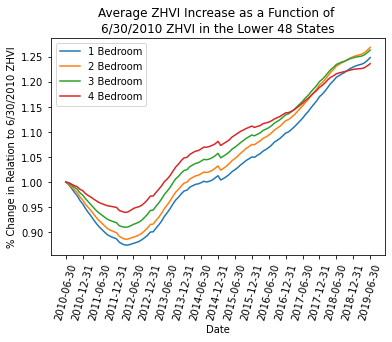

In [5]:
plt.plot(one_br_avgs['Date'],one_br_avgs['Weighted 1BR']/one_br_avgs['Weighted 1BR'][0],label='1 Bedroom')
plt.plot(two_br_avgs['Date'],two_br_avgs['Weighted 2BR']/two_br_avgs['Weighted 2BR'][0],label='2 Bedroom')
plt.plot(three_br_avgs['Date'],three_br_avgs['Weighted 3BR']/three_br_avgs['Weighted 3BR'][0],label='3 Bedroom')
plt.plot(four_br_avgs['Date'],four_br_avgs['Weighted 4BR']/four_br_avgs['Weighted 4BR'][0],label='4 Bedroom')
plt.legend()
plt.title('Average ZHVI Increase as a Function of \n6/30/2010 ZHVI in the Lower 48 States')
plt.xlabel('Date')
plt.xticks(xticks,rotation=75)
plt.ylabel('% Change in Relation to 6/30/2010 ZHVI')

The graph above shows the standardized home price indexes (in relation to the prices at June 30th, 2010). They all seem to rise pretty similarly. Although the value of 2 and 3 bedroom homes have increased about 1-2% more than 1 and 4 bedroom homes in the past year. However, it is also important to note that the 1 and 2 bedroom ZHVI dropped the most at the valley around 3/31/2012 while the 4 bedroom home prices dropped the least.

In [6]:
#now to look at population estimates
male_pop_sums = final_set.groupby('Date',as_index=False)['Male'].sum()
female_pop_sums = final_set.groupby('Date',as_index=False)['Female'].sum()
total_pop_sums = final_set.groupby('Date',as_index=False)['Total'].sum()

Text(0, 0.5, '% Population Increase since 6/30/2010')

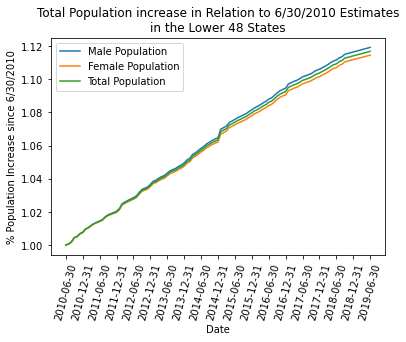

In [7]:
plt.plot(male_pop_sums['Date'],male_pop_sums['Male']/male_pop_sums['Male'][0],label='Male Population')
plt.plot(female_pop_sums['Date'],female_pop_sums['Female']/female_pop_sums['Female'][0],label='Female Population')
plt.plot(total_pop_sums['Date'],total_pop_sums['Total']/total_pop_sums['Total'][0],label='Total Population')
plt.legend()
plt.title('Total Population increase in Relation to 6/30/2010 Estimates\nin the Lower 48 States')
plt.xlabel('Date')
plt.xticks(xticks,rotation=75)
plt.ylabel('% Population Increase since 6/30/2010')

All three types of population are increasing at the same rate (as would be expected at the national level). The total population has risen by about 12% over the past 9 years. 

To simplify things, I will only have 4 age groups - group 1 will be dependent aged people (ages 0-19), group 2 will be young adults (ages 20-39), group 3 will be middle aged people (ages 40-64), and group 4 will be retiree aged people (ages 65 and older).

In [8]:
final_set['Age Group 1'] = final_set['1_TOT_POP'] + final_set['2_TOT_POP'] \
                                    + final_set['3_TOT_POP'] + final_set['4_TOT_POP']
final_set['Age Group 2'] = final_set['5_TOT_POP'] + final_set['6_TOT_POP'] \
                                    + final_set['7_TOT_POP'] + final_set['8_TOT_POP']
final_set['Age Group 3'] = final_set['9_TOT_POP'] + final_set['10_TOT_POP'] \
                                    + final_set['11_TOT_POP'] + final_set['12_TOT_POP'] + final_set['13_TOT_POP']
final_set['Age Group 4'] = final_set['14_TOT_POP'] + final_set['15_TOT_POP'] \
                                    + final_set['16_TOT_POP'] + final_set['17_TOT_POP'] + final_set['18_TOT_POP']

In [9]:
date_summed = final_set.groupby('Date',as_index=False).sum()

Text(0, 0.5, '% Population Increase since 6/30/2010')

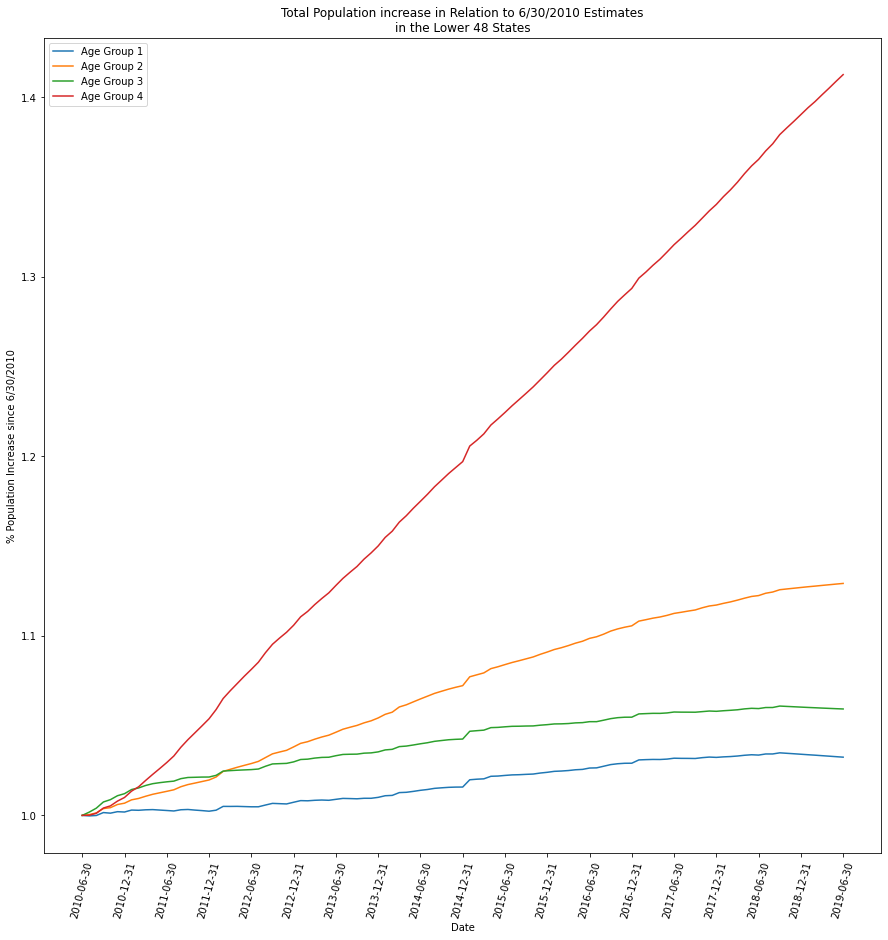

In [10]:
fig, ax = plt.subplots(1)
fig.set_size_inches((15,15))

for age in range(1,5):
    ax.plot(date_summed['Date'],date_summed['Age Group '+str(age)]/date_summed['Age Group '+str(age)][0],label='Age Group '+str(age))

plt.legend()
plt.title('Total Population increase in Relation to 6/30/2010 Estimates\nin the Lower 48 States')
plt.xlabel('Date')
plt.xticks(xticks,rotation=75)
plt.ylabel('% Population Increase since 6/30/2010')

The retiree group population has increased the most over the past 9 years, showing an increase just over 40%. The second group is the group of young adults, but their group population increased just below a quarter of the retiree group (roughy 12%).

### Now to start looking at more county specific visualizations

First I want to look at the change in all variables at the county level with respect to the last 6 months and 1, 5, and 9 years.

In [11]:
diff_cols = list(final_set.columns)
diff_cols.remove('Date')
diff_cols.remove('County and State')
diff_cols.remove('INTPTLAT')
diff_cols.remove('INTPTLONG                                                                                                               ')
diff_cols.remove('Weighted 1BR')
diff_cols.remove('Weighted 2BR')
diff_cols.remove('Weighted 3BR')
diff_cols.remove('Weighted 4BR')

In [12]:
#loop through all the different look back periods, and for each one record all differences across all counties into df
#creating list of dates to look back to
look_back_dates = [datetime.datetime(year=2018,month=12,day=31),datetime.datetime(year=2018,month=6,day=30),
                   datetime.datetime(year=2014,month=6,day=30),datetime.datetime(year=2010,month=6,day=30)]
#creating an empty list for each dataframe to be saved to
look_back_dfs = []
#setting the current date to know what to subtract values from
current_date = datetime.datetime(year=2019, month=6, day=30)
#keeping track of which counties have errors while doing this - some are expected because some earlier dates had to be 
#deleted for some of the counties because the zillow data didn't go back far enough for them.
erroneous = []
#now to loop through each look back date and find the two slices of data for each county and find the differences and record them
#at the end they are turned into a dataframe and appended to the look_back_dfs list
for look_back in look_back_dates:
    diffs = []
    counties = []
    look_back_date = look_back
    for c in np.unique(final_set['County and State']):
        try:
            #the differences are % of the data from the look back dates values so that all counties are on the same level independent of size
            diff = list((final_set.loc[c+' '+str(current_date),diff_cols] - final_set.loc[c+' '+str(look_back_date),diff_cols])/final_set.loc[c+' '+str(look_back_date),diff_cols])
            diff += list(final_set.loc[c+' '+str(current_date),['INTPTLAT','INTPTLONG                                                                                                               ']])
            diffs.append(diff)
            counties.append(c)
        except:
            erroneous.append(c)
            continue
    look_back_dfs.append(pd.DataFrame(diffs,index=counties,columns = diff_cols+['Lat','Lon']))

In [13]:
#now to check to make sure there aren't a lot of erroneous counties
print('There are a total of '+str(len(np.unique(erroneous)))+' counties where look backs were not able to be done')

There are a total of 454 counties where look backs were not able to be done


In [14]:
#at first glance, the number above seems high, but now I want to look at the shape of each look_back dataframe to make sure 
#the majority of incompletenesses is done at the longer lookback periods
for df in look_back_dfs:
    print(df.shape)

(2539, 71)
(2523, 71)
(2288, 71)
(2085, 71)


The above printing looks good. It shows that the first dataframe (6 month look back) has all counties represented, and then as the look back goes farther and farther back, the number of counties with complete data lowers. This is as expected.

In [15]:
#I have created this function to deal with plotting data with outliers. The main reason I need this is so that the
#outliers don't take up all the 'color space' and so that true trends can be seen in the coloring of the plots below
def cutOffOutliers(data,lowerQ, upperQ):
    lower = pd.Series(data).quantile(lowerQ)
    upper = pd.Series(data).quantile(upperQ)
    new_data = []
    for item in data:
        new_data.append(min(max(item,lower),upper))
    return new_data

## Maps of changes in ZHVI for different lookback periods

### 1 Bedroom ZHVI

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


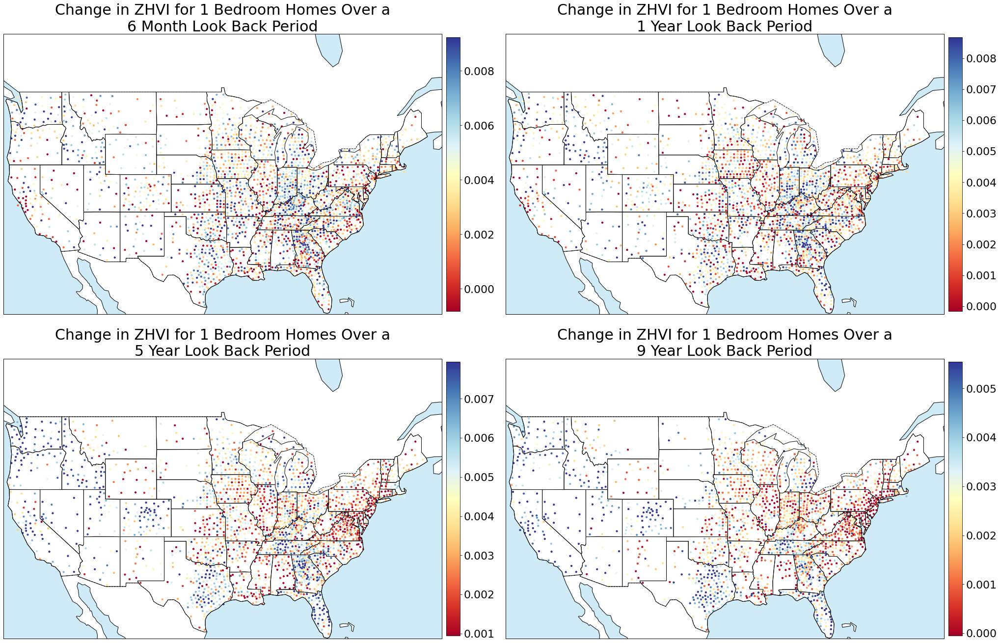

In [20]:
fig, ax = plt.subplots(2,2, figsize=(35,35),subplot_kw={'projection': crs.Mercator()})

fig.subplots_adjust(wspace=0.1, hspace=0)

titles = ['6 Month Look Back Period','1 Year Look Back Period','5 Year Look Back Period','9 Year Look Back Period']
#in order to have the coloring look similar, I will divide each output for color mapping by the number of months the look back is over
months = [6,12,60,108]

for i, look_back in enumerate(look_back_dfs):

    ax[int(i/2),i%2].add_feature(cfeature.COASTLINE)
    ax[int(i/2),i%2].add_feature(cfeature.LAND, color="white", alpha=0.5)
    ax[int(i/2),i%2].add_feature(cfeature.BORDERS, linestyle="--")
    ax[int(i/2),i%2].add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

    ax[int(i/2),i%2].add_feature(cfeature.STATES)

    ax[int(i/2),i%2].set_extent([-125, -65, 25, 50])
    
    ax[int(i/2),i%2].axis('off')

    cm = plt.cm.get_cmap('RdYlBu')

    sc = ax[int(i/2),i%2].scatter(look_back['Lon'], look_back['Lat'], 10, marker='o', c=cutOffOutliers(list(look_back['1BR ZHVI']/months[i]),0.1,0.9),
                     cmap=cm,transform=crs.PlateCarree())
    cbar = plt.colorbar(sc, ax = ax[int(i/2),i%2],fraction=0.03, pad=0.01)
    
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(22)
    
    ax[int(i/2),i%2].set_title('Change in ZHVI for 1 Bedroom Homes Over a\n'+titles[i],fontsize=30)
    
    subfig = ax[int(i/2),i%2].get_figure()
    subfig.tight_layout()
    subfig.subplots_adjust(top=0.65)
    
fig.tight_layout()

### 2 Bedroom ZHVI

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


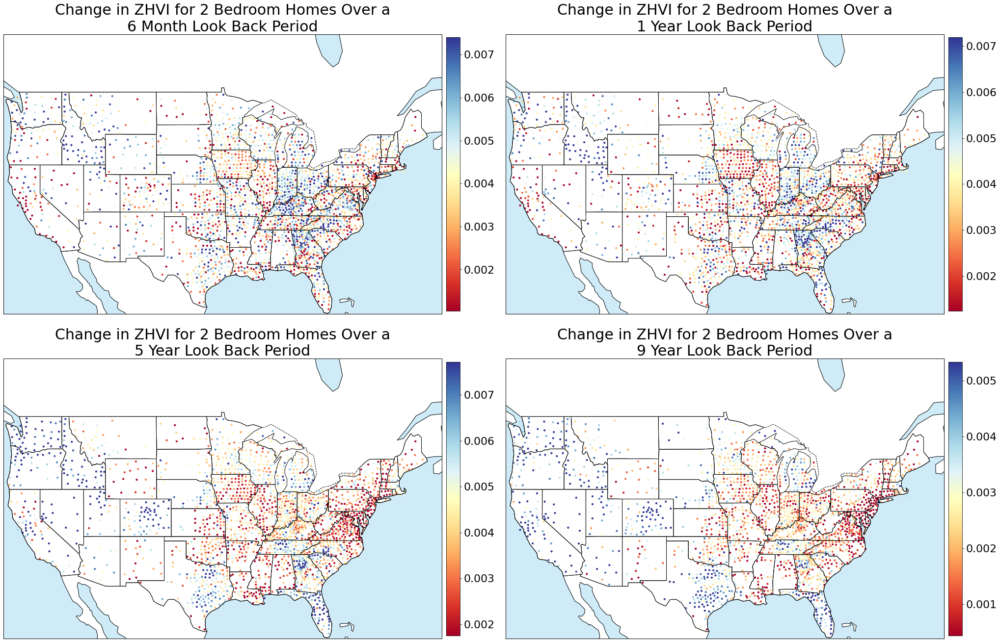

In [21]:
fig, ax = plt.subplots(2,2, figsize=(35,35),subplot_kw={'projection': crs.Mercator()})

fig.subplots_adjust(wspace=0.1, hspace=0)

titles = ['6 Month Look Back Period','1 Year Look Back Period','5 Year Look Back Period','9 Year Look Back Period']
#in order to have the coloring look similar, I will divide each output for color mapping by the number of months the look back is over
months = [6,12,60,108]

for i, look_back in enumerate(look_back_dfs):

    ax[int(i/2),i%2].add_feature(cfeature.COASTLINE)
    ax[int(i/2),i%2].add_feature(cfeature.LAND, color="white", alpha=0.5)
    ax[int(i/2),i%2].add_feature(cfeature.BORDERS, linestyle="--")
    ax[int(i/2),i%2].add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

    ax[int(i/2),i%2].add_feature(cfeature.STATES)

    ax[int(i/2),i%2].set_extent([-125, -65, 25, 50])
    
    ax[int(i/2),i%2].axis('off')

    cm = plt.cm.get_cmap('RdYlBu')

    sc = ax[int(i/2),i%2].scatter(look_back['Lon'], look_back['Lat'], 10, marker='o', c=cutOffOutliers(list(look_back['2BR ZHVI']/months[i]),0.1,0.9),
                     cmap=cm,transform=crs.PlateCarree())
    cbar = plt.colorbar(sc, ax = ax[int(i/2),i%2],fraction=0.03, pad=0.01)
    
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(22)
    
    ax[int(i/2),i%2].set_title('Change in ZHVI for 2 Bedroom Homes Over a\n'+titles[i],fontsize=30)
    
    subfig = ax[int(i/2),i%2].get_figure()
    subfig.tight_layout()
    subfig.subplots_adjust(top=0.65)
    
fig.tight_layout()

### 3 Bedroom ZHVI

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


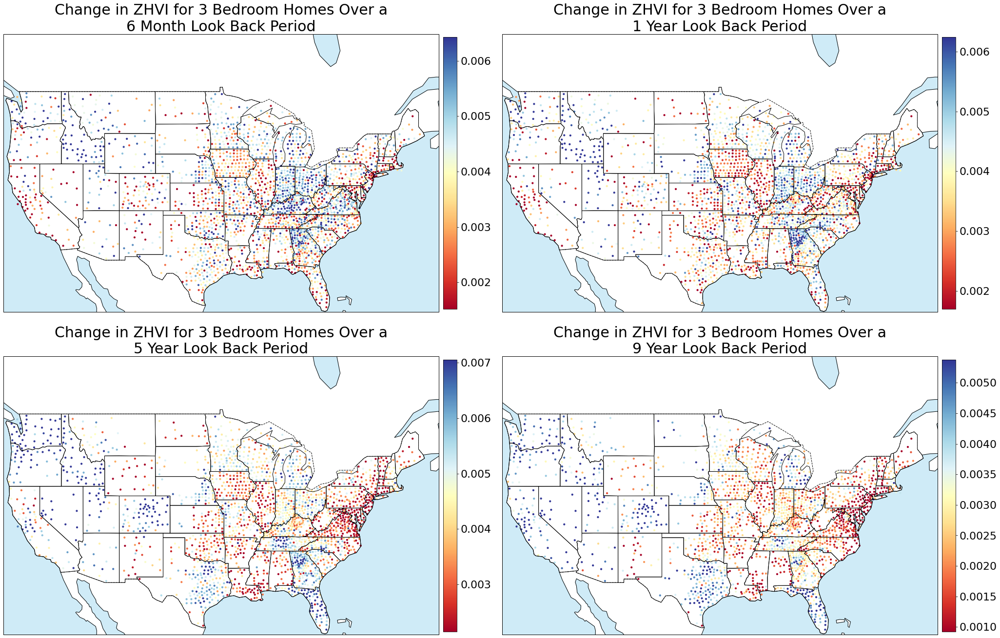

In [22]:
fig, ax = plt.subplots(2,2, figsize=(35,35),subplot_kw={'projection': crs.Mercator()})

fig.subplots_adjust(wspace=0.1, hspace=0)

titles = ['6 Month Look Back Period','1 Year Look Back Period','5 Year Look Back Period','9 Year Look Back Period']
#in order to have the coloring look similar, I will divide each output for color mapping by the number of months the look back is over
months = [6,12,60,108]

for i, look_back in enumerate(look_back_dfs):

    ax[int(i/2),i%2].add_feature(cfeature.COASTLINE)
    ax[int(i/2),i%2].add_feature(cfeature.LAND, color="white", alpha=0.5)
    ax[int(i/2),i%2].add_feature(cfeature.BORDERS, linestyle="--")
    ax[int(i/2),i%2].add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

    ax[int(i/2),i%2].add_feature(cfeature.STATES)

    ax[int(i/2),i%2].set_extent([-125, -65, 25, 50])
    
    ax[int(i/2),i%2].axis('off')

    cm = plt.cm.get_cmap('RdYlBu')

    sc = ax[int(i/2),i%2].scatter(look_back['Lon'], look_back['Lat'], 10, marker='o', c=cutOffOutliers(list(look_back['3BR ZHVI']/months[i]),0.1,0.9),
                     cmap=cm,transform=crs.PlateCarree())
    cbar = plt.colorbar(sc, ax = ax[int(i/2),i%2],fraction=0.03, pad=0.01)
    
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(22)
    
    ax[int(i/2),i%2].set_title('Change in ZHVI for 3 Bedroom Homes Over a\n'+titles[i],fontsize=30)
    
    subfig = ax[int(i/2),i%2].get_figure()
    subfig.tight_layout()
    subfig.subplots_adjust(top=0.65)
    
fig.tight_layout()

### 4 Bedroom ZHVI

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


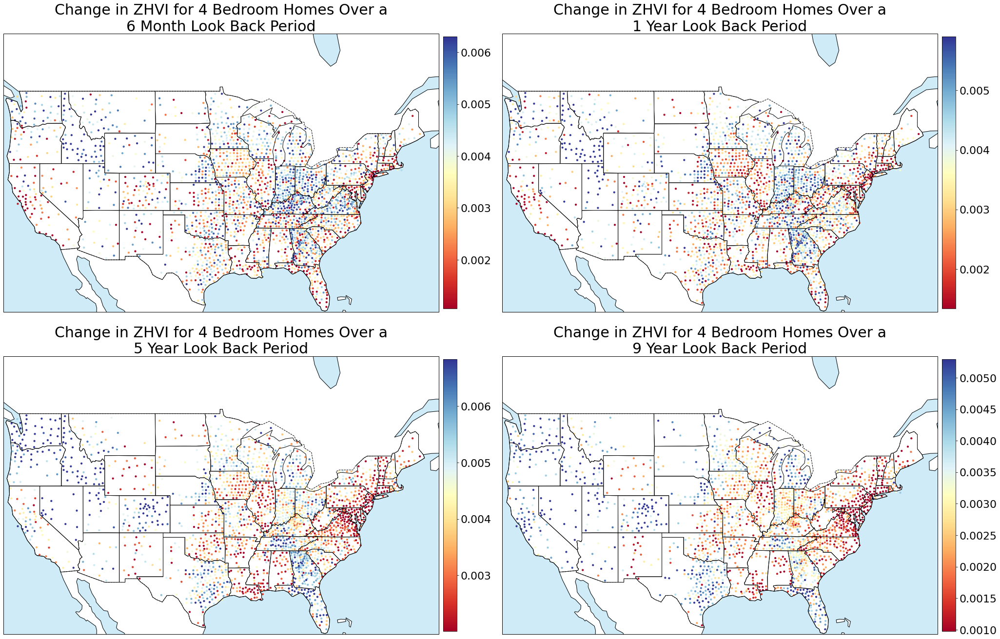

In [23]:
fig, ax = plt.subplots(2,2, figsize=(35,35),subplot_kw={'projection': crs.Mercator()})

fig.subplots_adjust(wspace=0.1, hspace=0)

titles = ['6 Month Look Back Period','1 Year Look Back Period','5 Year Look Back Period','9 Year Look Back Period']
#in order to have the coloring look similar, I will divide each output for color mapping by the number of months the look back is over
months = [6,12,60,108]

for i, look_back in enumerate(look_back_dfs):

    ax[int(i/2),i%2].add_feature(cfeature.COASTLINE)
    ax[int(i/2),i%2].add_feature(cfeature.LAND, color="white", alpha=0.5)
    ax[int(i/2),i%2].add_feature(cfeature.BORDERS, linestyle="--")
    ax[int(i/2),i%2].add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

    ax[int(i/2),i%2].add_feature(cfeature.STATES)

    ax[int(i/2),i%2].set_extent([-125, -65, 25, 50])
    
    ax[int(i/2),i%2].axis('off')

    cm = plt.cm.get_cmap('RdYlBu')

    sc = ax[int(i/2),i%2].scatter(look_back['Lon'], look_back['Lat'], 10, marker='o', c=cutOffOutliers(list(look_back['4BR ZHVI']/months[i]),0.1,0.9),
                     cmap=cm,transform=crs.PlateCarree())
    cbar = plt.colorbar(sc, ax = ax[int(i/2),i%2],fraction=0.03, pad=0.01)
    
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(22)
    
    ax[int(i/2),i%2].set_title('Change in ZHVI for 4 Bedroom Homes Over a\n'+titles[i],fontsize=30)
    
    subfig = ax[int(i/2),i%2].get_figure()
    subfig.tight_layout()
    subfig.subplots_adjust(top=0.65)
    
fig.tight_layout()

For all the different sized homes, and for all the lookback periods, it seems like the areas west of the continental divide, the southeast (mainly Atlanta, GA, Nasheville, TN and Florida), as well as Texas are showing increases in ZHVI. When looking at the more recent lookback periods (6 months and 1 year) we see that the Ohio, Indiana, and Kentucky areas are showing increases in ZHVI. This trend is the most evident in homes sized 2 bedrooms and larger. <br>
Also, overall, it is important to note that a lot of increases appear scattered across the maps in the 6 month lookback period, but the areas of increases are more centralized or congested in the longer look back periods. Overall, the 5 year look back period seems the best for studying what happens in trending areas, and the shorter lookback periods may be best for determing which areas might be starting trends.

## Maps of changes in population over different lookback periods.

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


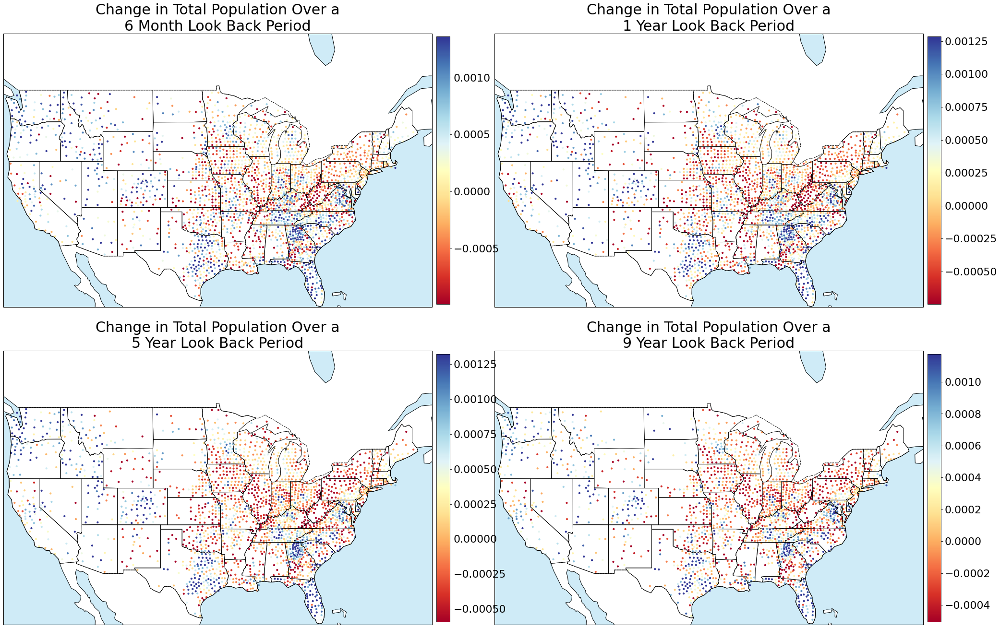

In [24]:
fig, ax = plt.subplots(2,2, figsize=(35,35),subplot_kw={'projection': crs.Mercator()})

fig.subplots_adjust(wspace=0.1, hspace=0)

titles = ['6 Month Look Back Period','1 Year Look Back Period','5 Year Look Back Period','9 Year Look Back Period']
#in order to have the coloring look similar, I will divide each output for color mapping by the number of months the look back is over
months = [6,12,60,108]

for i, look_back in enumerate(look_back_dfs):

    ax[int(i/2),i%2].add_feature(cfeature.COASTLINE)
    ax[int(i/2),i%2].add_feature(cfeature.LAND, color="white", alpha=0.5)
    ax[int(i/2),i%2].add_feature(cfeature.BORDERS, linestyle="--")
    ax[int(i/2),i%2].add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

    ax[int(i/2),i%2].add_feature(cfeature.STATES)

    ax[int(i/2),i%2].set_extent([-125, -65, 25, 50])
    
    ax[int(i/2),i%2].axis('off')

    cm = plt.cm.get_cmap('RdYlBu')

    sc = ax[int(i/2),i%2].scatter(look_back['Lon'], look_back['Lat'], 10, marker='o', c=cutOffOutliers(list(look_back['Total']/months[i]),0.1,0.9),
                     cmap=cm,transform=crs.PlateCarree())
    cbar = plt.colorbar(sc, ax = ax[int(i/2),i%2],fraction=0.03, pad=0.01)
    
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(22)
    
    ax[int(i/2),i%2].set_title('Change in Total Population Over a\n'+titles[i],fontsize=30)
    
    subfig = ax[int(i/2),i%2].get_figure()
    subfig.tight_layout()
    subfig.subplots_adjust(top=0.65)
    
fig.tight_layout()

When looking at the differences in populations in the figures above, I can see that in all four time periods, Atlanta GA, most of FL, D.C, Nasheville TN, Raleigh NC, Dallas and Austin and Houston TX, most of CO, Salt Lake City UT, Portland, OR, Seattle and Bellingham WA, San Francisco CA, and Minneapolis MN in particular have seen increases in populations.<br>
However, to put it more broadly, states west of the continental divide, the southeast, and Texas have seen increases in population. The regions that have seen decreases or steady population are the midwest and the northeast states.<br>
All the areas showing increases in population have also shown increases in ZHVI.

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


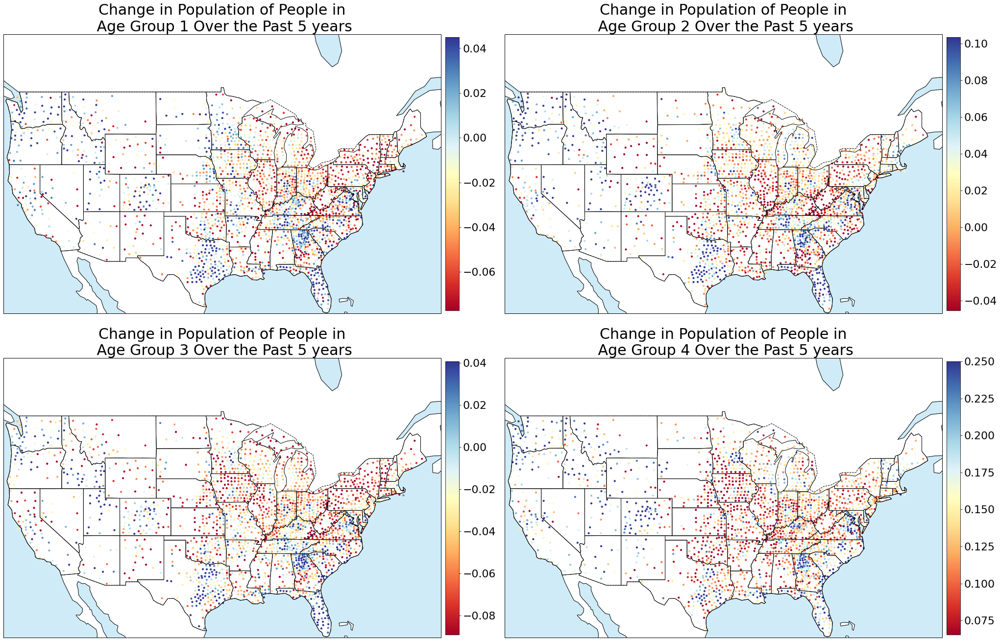

In [25]:
#now I want to see how age group populations have changed across the country.
#I will only look at the 5 year changes since this seems like a good middle ground for a time frame and I don't want
#to show 16 different figures by showing all look back time frames
fig, ax = plt.subplots(2,2, figsize=(35,35),subplot_kw={'projection': crs.Mercator()})

fig.subplots_adjust(wspace=0.1, hspace=0)

titles = ['Age Group 1','Age Group 2','Age Group 3','Age Group 4']
#in order to have the coloring look similar, I will divide each output for color mapping by the number of months the look back is over
months = [1]*len(titles)
groups = ['Age Group 1','Age Group 2','Age Group 3','Age Group 4']
look_back = look_back_dfs[2]
for i, group in enumerate(groups):

    ax[int(i/2),i%2].add_feature(cfeature.COASTLINE)
    ax[int(i/2),i%2].add_feature(cfeature.LAND, color="white", alpha=0.5)
    ax[int(i/2),i%2].add_feature(cfeature.BORDERS, linestyle="--")
    ax[int(i/2),i%2].add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

    ax[int(i/2),i%2].add_feature(cfeature.STATES)

    ax[int(i/2),i%2].set_extent([-125, -65, 25, 50])
    
    ax[int(i/2),i%2].axis('off')

    cm = plt.cm.get_cmap('RdYlBu')

    sc = ax[int(i/2),i%2].scatter(look_back['Lon'], look_back['Lat'], 10, marker='o', c=cutOffOutliers(list(look_back[group]/months[i]),0.1,0.9),
                     cmap=cm,transform=crs.PlateCarree())
    cbar = plt.colorbar(sc, ax = ax[int(i/2),i%2],fraction=0.03, pad=0.01)
    
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(22)
    
    ax[int(i/2),i%2].set_title('Change in Population of People in\n '+titles[i]+' Over the Past 5 years',fontsize=30)
    
    subfig = ax[int(i/2),i%2].get_figure()
    subfig.tight_layout()
    subfig.subplots_adjust(top=0.65)
    
fig.tight_layout()

These maps above show that many places seeing population increases are seeing increases in populations of all age groups.

## Maps of changes in home units over different lookback periods.

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:34: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:37: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


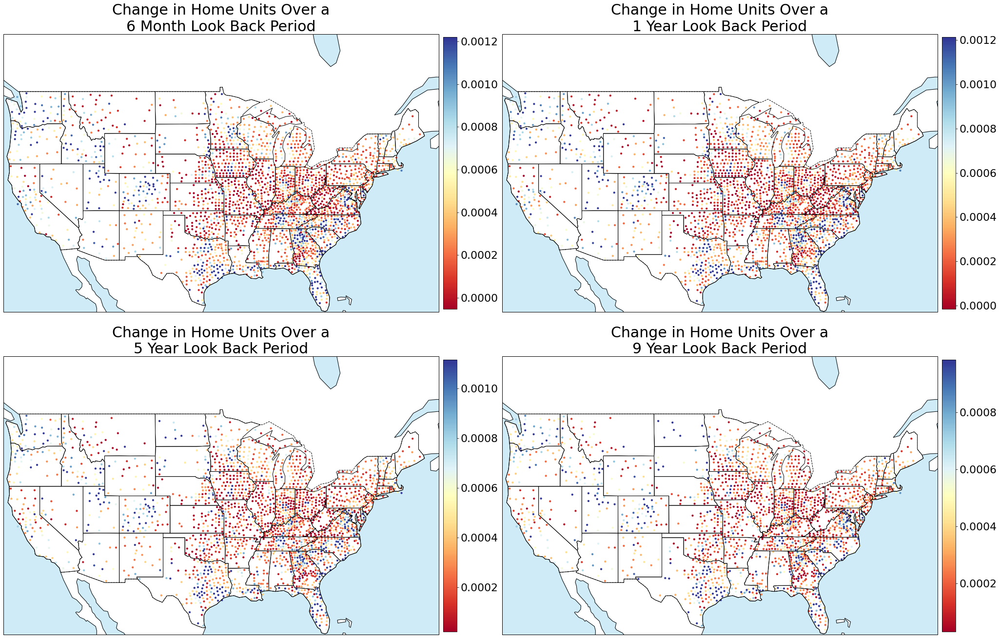

In [26]:
fig, ax = plt.subplots(2,2, figsize=(35,35),subplot_kw={'projection': crs.Mercator()})

fig.subplots_adjust(wspace=0.1, hspace=0)

titles = ['6 Month Look Back Period','1 Year Look Back Period','5 Year Look Back Period','9 Year Look Back Period']
#in order to have the coloring look similar, I will divide each output for color mapping by the number of months the look back is over
months = [6,12,60,108]

for i, look_back in enumerate(look_back_dfs):

    ax[int(i/2),i%2].add_feature(cfeature.COASTLINE)
    ax[int(i/2),i%2].add_feature(cfeature.LAND, color="white", alpha=0.5)
    ax[int(i/2),i%2].add_feature(cfeature.BORDERS, linestyle="--")
    ax[int(i/2),i%2].add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

    ax[int(i/2),i%2].add_feature(cfeature.STATES)

    ax[int(i/2),i%2].set_extent([-125, -65, 25, 50])
    
    ax[int(i/2),i%2].axis('off')

    cm = plt.cm.get_cmap('RdYlBu')

    sc = ax[int(i/2),i%2].scatter(look_back['Lon'], look_back['Lat'], 10, marker='o', c=cutOffOutliers(list(look_back['Home Units']/months[i]),0.1,0.9),
                     cmap=cm,transform=crs.PlateCarree())
    cbar = plt.colorbar(sc, ax = ax[int(i/2),i%2],fraction=0.03, pad=0.01)
    
    for t in cbar.ax.get_yticklabels():
         t.set_fontsize(22)
    
    ax[int(i/2),i%2].set_title('Change in Home Units Over a\n'+titles[i],fontsize=30)
    
    subfig = ax[int(i/2),i%2].get_figure()
    subfig.tight_layout()
    subfig.subplots_adjust(top=0.65)
    
fig.tight_layout()

These maps above show that many places seeing increases in ZHVI are also seeing strong increases in home units. However, not all areas are seeing increases of the same degree. For example, the ZHVI increase maps showed areas all along the Pacific coast as having somewhat equal looking ZHVI increases. However, looking at the home units maps, much of California hasn't seen as much increases in home units as Oregon and Washington have. Another example is eastern Texas. This whole area of Texas has shown strong increases in ZHVI, but the increases in home units seems more centralized to Dallas, Austin, and Houston. This example suggests that the home units increases may be more centralized to cities and suburbs, but the impact on home prices stretches further. This shows the home units variable is important for predicting home price increases in cities and suburbs, but it may be difficult to predict how far beyond these areas it will impact.

## Exploring Correlations

In [27]:
scatter_cols2 = ['1BR ZHVI','2BR ZHVI','3BR ZHVI','4BR ZHVI','Total','Male','Female','Home Units','Age Group 1',
                 'Age Group 2','Age Group 3','Age Group 4']

### 6 month lookback correlations

In [32]:
t = look_back_dfs[0][scatter_cols2].corr()
t.loc['Total':,'1BR ZHVI':'4BR ZHVI']

,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI
Total,0.118744,0.134378,0.073811,0.011228
Male,0.104528,0.121336,0.067344,0.017869
Female,0.114146,0.122536,0.063880,-0.003801
Home Units,0.054735,0.028322,-0.053963,-0.117524
Age Group 1,0.075390,0.083778,0.042304,0.024116
Age Group 2,0.073636,0.082185,0.048231,0.010536
Age Group 3,0.115791,0.139808,0.089379,0.015888
Age Group 4,0.066495,0.068962,-0.008944,-0.089815


There aren't any high correlations in this table above.

### 1 year lookback correlations

In [33]:
t = look_back_dfs[1][scatter_cols2].corr()
t.loc['Total':,'1BR ZHVI':'4BR ZHVI']

,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI
Total,0.228221,0.265110,0.193121,0.092554
Male,0.204150,0.233054,0.175151,0.089500
Female,0.231348,0.272613,0.189516,0.082443
Home Units,0.157950,0.176410,0.085802,-0.004875
Age Group 1,0.166119,0.162399,0.118950,0.066037
Age Group 2,0.179747,0.205828,0.150640,0.073557
Age Group 3,0.204412,0.252914,0.189793,0.085361
Age Group 4,0.142705,0.184658,0.103967,0.006349


There are small but noticeable correlations between the following variables:<br>
1. 1BR ZHVI & Total Population (sligthly more correlation for females than males, and the age group with the highest correlation is group 3), and Home Units.<br>
2. 2BR ZHVI & Total Population (slightly more correlation for females than males, and the age group with the highest correlation is group 3), and Home Units.<br>
3. 3BR ZHVI & Total Population (sligthly more correlation for females than males, and the age group with the highest correlation is group 3).<br>
4. 4BR ZHVI & No Variables.<br>
<b>Overall</b> I interpret this as showing that population drives the prices the most, but in particular, the people I infer to be in the middle of their careers (age group 3) seem to drive the home prices the most.

### 5 year lookback correlations

In [34]:
t = look_back_dfs[2][scatter_cols2].corr()
t.loc['Total':,'1BR ZHVI':'4BR ZHVI']

,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI
Total,0.403371,0.465631,0.407303,0.272270
Male,0.405267,0.461791,0.402608,0.272525
Female,0.388282,0.456912,0.401579,0.263977
Home Units,0.283660,0.314975,0.238551,0.103503
Age Group 1,0.301182,0.351289,0.306938,0.210473
Age Group 2,0.385797,0.444972,0.409555,0.296181
Age Group 3,0.350187,0.406263,0.350724,0.212908
Age Group 4,0.265224,0.306236,0.242394,0.123204


The 5 year differences have much stronger correlations present. They are listed below:<br>
1. 1BR ZHVI & Total Population (this time roughly equal correlations for each gender, and the age group with the highest correlation is group 2), and Home Units. <br>
2. 2BR ZHVI & the same variables as listed for 1BR ZHVI, except the correlations with 2BR ZHVI are about 0.04 to 0.06 higher on average. <br>
3. 3BR ZHVI & the same variables and similar correlations as 1BR ZHVI.<br>
4. 4BR ZHVI & similar variables as 1BR but much lower correlations.<br>
Overall, it seems like the 2BR ZHVI is most strongly correlated with the accompanied county data. Also, I interpret these correlations as showing home units is more important when looking at a longer time frame (higher correlations to ZHVI than the 1 year lookback), and when looking at the 5 year look back period, the group I infer to be starting their careers, or not too far into them (age group 2) is most important in driving home values.

### 9 year lookback correlations

In [35]:
t = look_back_dfs[3][scatter_cols2].corr()
t.loc['Total':,'1BR ZHVI':'4BR ZHVI']

,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI
Total,0.316523,0.357448,0.322405,0.206379
Male,0.319155,0.361551,0.326699,0.214427
Female,0.307269,0.346735,0.312578,0.194059
Home Units,0.252540,0.256722,0.225030,0.140078
Age Group 1,0.256992,0.281324,0.263600,0.181113
Age Group 2,0.331763,0.380829,0.357056,0.262060
Age Group 3,0.238422,0.267579,0.244944,0.141848
Age Group 4,0.198297,0.225824,0.181981,0.085363


The 10 year correlations are similar to the 5 year difference correlations, but lower in most cases. However, the home units correlations have only decreased slightly. Also, the age group 2 still shows the highest correlations among all the age groups. Also among all the correlations with population and home units variables, the 2BR ZHVI shows the highest correlations. 

## Now to see if I can distinguish different groupings of counties by their characteristics.

My thought process for this is that maybe counties with certain characteristics may have home value increases for related to the these variables. For example, maybe the ZHVI is most predictable in large counties or small counties.

array([[<AxesSubplot:title={'center':'Total'}>,
        <AxesSubplot:title={'center':'Home Units'}>]], dtype=object)

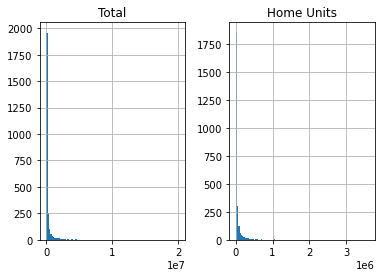

In [191]:
#look at the distributions of total population and home units per county
final_set_cut = final_set[final_set['Date']==str(current_date)[:10]]
final_set_cut = final_set_cut[final_set_cut['Total']>=final_set_cut['Total'].quantile(0.0)]
final_set_cut[['Total','Home Units']].hist(bins=100)

The histograms above show that the majority of counties in the United States are small in terms of their population and the estimated number of home units.

array([[<AxesSubplot:title={'center':'Total'}>,
        <AxesSubplot:title={'center':'Home Units'}>]], dtype=object)

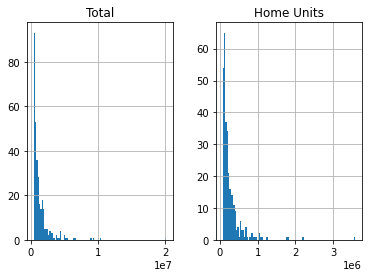

In [192]:
#there are a lot of counties with low populations and low home units - these make it more difficult to see the true distribution
#as I will only see a really bar at the beginning that eats up the vertical space of the graph
#therefore I will cut out the bottom 87.5% of the data before I plot to see if there is another mode of counties with higher populations and home units
final_set_cut = final_set[final_set['Date']==str(current_date)[:10]]
final_set_cut = final_set_cut[final_set_cut['Total']>=final_set_cut['Total'].quantile(0.875)]
final_set_cut[['Total','Home Units']].hist(bins=100)

The counties are VERY heavily skewed towards the lower end. Even with only showing the top 12.5% of the data, the histograms look skewed.

### Now to explore specific types of counties and see if subsetting the data offers better correlations.<br>
I will try creating n different groups of population sizes and then plot the moving average of the correlations between Total Population growth and Home Units growth as a function of how many groups we have divided. Since the initial correlations look best against the 2BR ZHVI, I will only look into 2BR ZHVI for partitioning the data.

In [43]:
final_set_cut = final_set[final_set['Date']==str(current_date)[:10]]
final_cut = final_set_cut.copy()
final_cut.index = final_cut['County and State']

In [47]:
all_total_corrs = []
all_units_corrs = []
for j in range(4):
    max_corr_record_total = []
    max_corr_record_units = []
    for n in range(1,201):
        cutting = pd.qcut(final_cut['Total'],n,labels=range(n))
        corr_record_total = []
        corr_record_units = []
        for i in range(n):
            counties = list(cutting[cutting==i].index)
            look_back_group = look_back_dfs[j]
            group = look_back_group[look_back_group.index.isin(counties)]
            cors = group.corr()
            corr_record_total.append(cors.loc['Total','2BR ZHVI'])
            corr_record_units.append(cors.loc['Home Units','2BR ZHVI'])
        #creating the period over which to do the moving average to ensure the correlation covers a group roughly 10% or more of the total sample of counties
        period = max(1,int(n*.1))
        #calculate the moving average, but only if there is atleast 1 value in the list of correlations
        if len(corr_record_total) > 1:
            corr_record_total = list(pd.Series(corr_record_total).rolling(period).mean().tolist())[period-1:]
            corr_record_units = list(pd.Series(corr_record_units).rolling(period).mean().tolist())[period-1:]
        #recording the max correlation for both population and home units
        max_corr_record_total.append(max(list(corr_record_total)))
        max_corr_record_units.append(max(list(corr_record_units)))
    #record them in the grand lists  
    all_total_corrs.append(max_corr_record_total)
    all_units_corrs.append(max_corr_record_units)

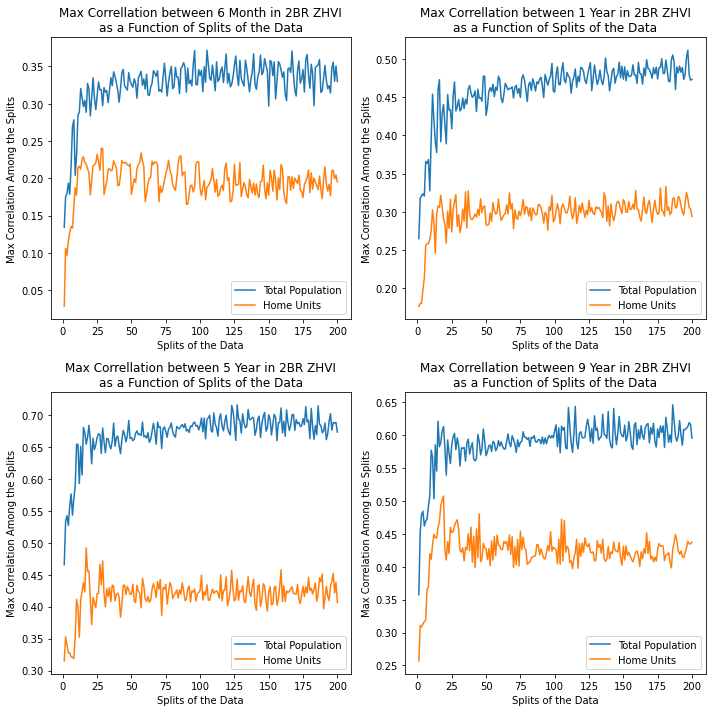

In [48]:
fig, ax = plt.subplots(2,2)
fig.set_size_inches((10,10))
titles = ['6 Month','1 Year','5 Year','9 Year']
for i in range(4):
    ax[int(i/2),i%2].plot(range(1,201),all_total_corrs[i],label='Total Population')
    ax[int(i/2),i%2].plot(range(1,201),all_units_corrs[i],label='Home Units')
    ax[int(i/2),i%2].legend()
    ax[int(i/2),i%2].set_title('Max Correllation between '+titles[i]+' in 2BR ZHVI\nas a Function of Splits of the Data')
    ax[int(i/2),i%2].set_xlabel('Splits of the Data')
    ax[int(i/2),i%2].set_ylabel('Max Correlation Among the Splits')
fig.tight_layout()

The above plot shows the impact of partitioning the data into subgroups on the correlation between the change in total population and home units with the change in 2BR ZHVI over different time periods. The lines represent the maximum value for a moving average (the moving averages are calculated over a period that is changing as a function of the number of partitions so that the period in the moving average reflects ~ 10% or more of the counties so we aren't seeing groups that are too specific) of the correlations among the subgroups for each number of partitions. This way, the maximum values plotted reflect the values surrounding each respective group rather than just the maximum correlation found within one specific group. If only the maximum correlations within a group were plotted, the correlations would continue to increase because the more you partition the data, the higher the chance is that you get one of the partitions having a high correlation but it doesn't accurately reflect the true relationship.<br>
Based on the plot above, I will choose to only partition the data into 20 population based county groups because after this point, the correlations don't really substantially increase. Below I will explore how large the group is that yields the correlations of ~0.67 and ~0.47 and then only explore these groups because when investing in real estate we want to be investing in counties whose home values are more predictable.

In [49]:
#now I want to see what population groups should be squeezed together to form one large group 
n = 20
cut = pd.qcut(final_cut['Total'],n,labels=range(n))
total_pop_corrs = []
total_units_corrs = []
for j in range(4):
    pops = []
    units = []
    for i in range(n):
        counties = list(cut[cut==i].index)
        look_back_group = look_back_dfs[j]
        group = look_back_group[look_back_group.index.isin(counties)]
        cors = group.corr()
        pops.append(cors.loc['Total','2BR ZHVI'])
        units.append(cors.loc['Home Units','2BR ZHVI'])
    total_pop_corrs.append(pops)
    total_units_corrs.append(units)

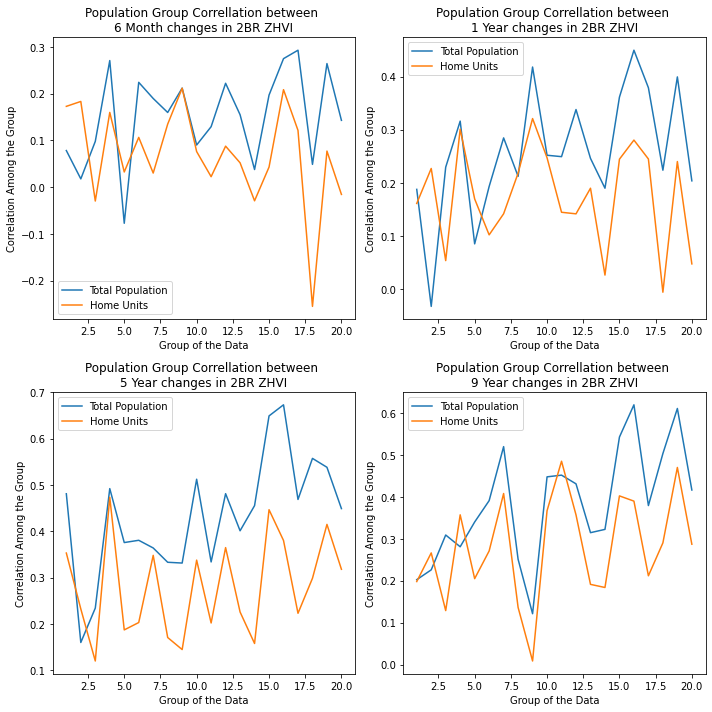

In [50]:
#now to plot them to see if the higher correlations are 'spikes' or 'plateaus'. I am hoping to see plateaus.
fig, ax = plt.subplots(2,2)
fig.set_size_inches((10,10))
titles = ['6 Month','1 Year','5 Year','9 Year']
for i in range(4):
    ax[int(i/2),i%2].plot(range(1,n+1),total_pop_corrs[i],label='Total Population')
    ax[int(i/2),i%2].plot(range(1,n+1),total_units_corrs[i],label='Home Units')
    ax[int(i/2),i%2].legend()
    ax[int(i/2),i%2].set_title('Population Group Correllation between \n'+titles[i]+' changes in 2BR ZHVI')
    ax[int(i/2),i%2].set_xlabel('Group of the Data')
    ax[int(i/2),i%2].set_ylabel('Correlation Among the Group')
fig.tight_layout()

In both the 5 and 9 year differences charts, the correlations increase toward the higher population groups. It looks like the higest correlations overall are yielded from picking an overall group as subgroup 15 through 20. Since the 5 year look back period seems to yield the highest correlations, I will choose this look back time frame to use for the rest of the project.

In [51]:
#creating the supergroup
group_counties = []
for i in range(15,21):
    group_counties += list(cut[cut==i].index)
#now that I have the list of counties included in the groups 15-20 I will create an over dataframe subset including only these counties
final_subgroup_df = final_set[final_set['County and State'].isin(group_counties)]

In [52]:
print('This super group includes '+str(len(group_counties))+' counties.')
print('The shape of the super group dataframe is '+str(final_subgroup_df.shape))

This super group includes 635 counties.
The shape of the super group dataframe is (67118, 77)


There are still 635 counties represented in this super group dataframe which is good (there were originally 2,539).

In [53]:
super_group_lookback = look_back_dfs[2]
super_group_lookback = super_group_lookback[super_group_lookback.index.isin(group_counties)]

In [58]:
t = super_group_lookback.corr()
t.loc[['Total','Male','Female','Age Group 1','Age Group 2','Age Group 3','Age Group 4','Home Units'],'1BR ZHVI':'4BR ZHVI']

,1BR ZHVI,2BR ZHVI,3BR ZHVI,4BR ZHVI
Total,0.492005,0.527225,0.493103,0.400994
Male,0.500153,0.535142,0.500244,0.408376
Female,0.481575,0.516720,0.483418,0.391583
Age Group 1,0.398711,0.446424,0.411474,0.338632
Age Group 2,0.533111,0.578426,0.538605,0.450878
Age Group 3,0.437581,0.479408,0.451705,0.351727
Age Group 4,0.325680,0.321083,0.316881,0.240445
Home Units,0.322510,0.327324,0.304569,0.223423


Wow! This new set of counties has much higher correlations (still not high, but better). It is interesting to note that Age Group 2 still shows the highest correlations out of all the age groups.

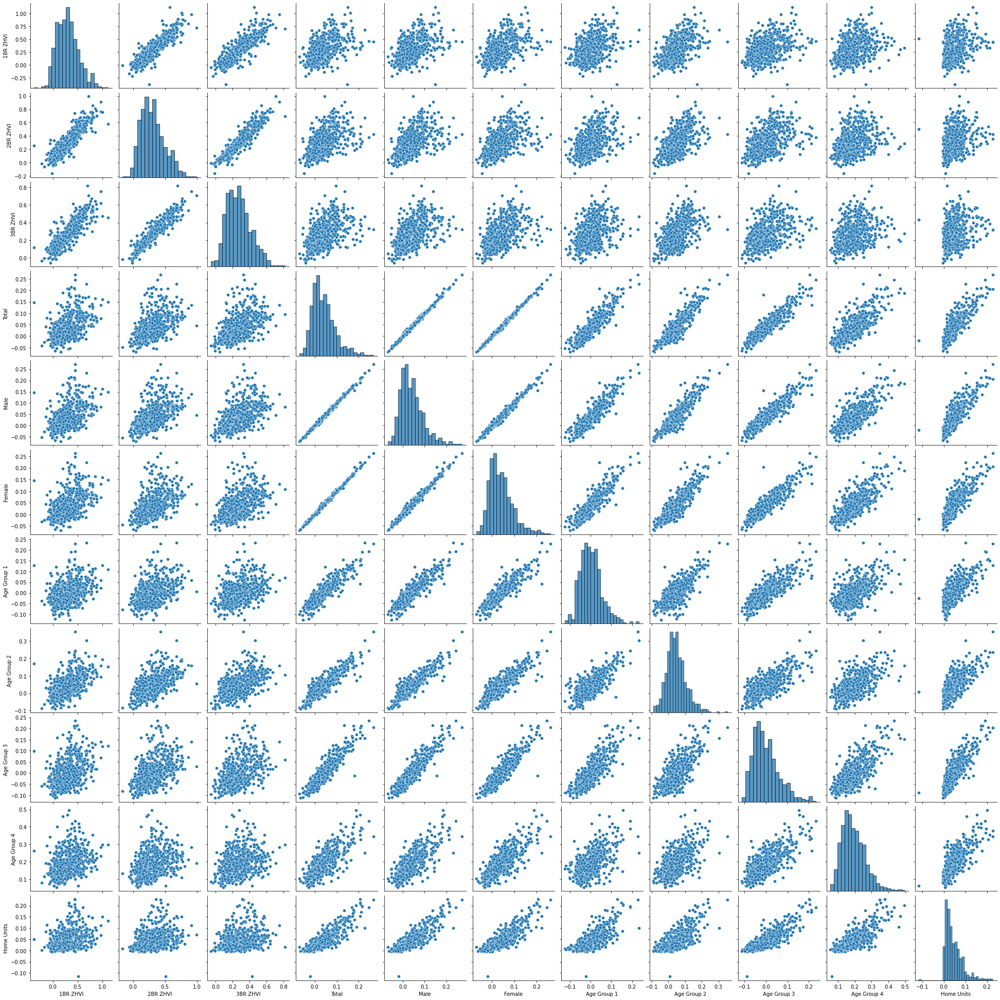

In [61]:
#now I would like to show what these look like in a scatterplot matrix to see the relationships represented graphically
sns.pairplot(super_group_lookback[['1BR ZHVI','2BR ZHVI','3BR ZHVI','Total','Male','Female','Age Group 1','Age Group 2',
                                  'Age Group 3', 'Age Group 4','Home Units']])

The scatterplot matrix above shows these correlations quite well. All the features have a positive correlation with the ZHVI values. Most of the features are showing a fanning pattern, which suggests the correlations become weaker when dealing with counties with higher home values. In particular, there is fanning with the Home Units and Age Group 4 variable.

# Analysis / Hypothesis Testing

In my project proposal, I had mentioned also including rental pricing in my analysis/hypothesis testing, but I hadn't realized how incomplete the rental data set was in terms of counties included. Therefore, the analysis/hypothesis testing will only include home pricing.

### Hypothesis 1: Do increases in younger residents increase the value of homes? If so, which types of homes in particular.

Age Group 2 is the younger resident this hypothesis is interested in. I will split up the counties into two groups - below or above median 5 year increase (as % of the respective population 5 years ago) in Age Group 2 population. Then, for each home size, I will compare the mean ZHVI change using a t test.

In [62]:
#splitting the data into two halves based on the median
lower_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Age Group 2']<=super_group_lookback['Age Group 2'].quantile(0.5)]
upper_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Age Group 2']>super_group_lookback['Age Group 2'].quantile(0.5)]

lower_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Age Group 2']<=super_group_lookback['Age Group 2'].quantile(0.5)]
upper_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Age Group 2']>super_group_lookback['Age Group 2'].quantile(0.5)]

lower_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Age Group 2']<=super_group_lookback['Age Group 2'].quantile(0.5)]
upper_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Age Group 2']>super_group_lookback['Age Group 2'].quantile(0.5)]

lower_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Age Group 2']<=super_group_lookback['Age Group 2'].quantile(0.5)]
upper_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Age Group 2']>super_group_lookback['Age Group 2'].quantile(0.5)]

In [63]:
#test to see if the mean increase in various ZHVI is significantly greater in the upper half group than the lower half group
#using the 2 sample t test - the two samples and independent since they each include non overlapping counties. Based on the scatterplot 
#matrix above, the variables are roughly normal
test_1br, p_1br = ttest_ind(list(upper_half_1br), list(lower_half_1br),equal_var=False)
test_2br, p_2br = ttest_ind(list(upper_half_2br), list(lower_half_2br),equal_var=False)
test_3br, p_3br = ttest_ind(list(upper_half_3br), list(lower_half_3br),equal_var=False)
test_4br, p_4br = ttest_ind(list(upper_half_4br), list(lower_half_4br),equal_var=False)

In [64]:
print('Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in age group 2.')
print('T value of '+str(test_1br)+' and a p-value of '+str(p_1br))
print('\n')
print('Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age group 2.')
print('T value of '+str(test_2br)+' and a p-value of '+str(p_2br))
print('\n')
print('Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age group 2.')
print('T value of '+str(test_3br)+' and a p-value of '+str(p_3br))
print('\n')
print('Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age group 2.')
print('T value of '+str(test_4br)+' and a p-value of '+str(p_4br))

Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in age group 2.
T value of 12.576965831955219 and a p-value of 3.932522336191517e-32


Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age group 2.
T value of 14.137628249479326 and a p-value of 5.612661511401241e-39


Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age group 2.
T value of 12.688642726474345 and a p-value of 1.2456036114251595e-32


Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age group 2.
T value of 10.150981864623429 and a p-value of 2.2684667678839104e-22


The above t-test results suggest that counties with above median 5 year increases in populations among people in age group 2 on average have statistically significant higher home values of 1 - 4 bedrooms on average compared to counties with below median increases. In particular, the highest mean difference is seen in 2 bedroom homes and the lowest is seen with 4 bedroom homes.

### Hypothesis 2: Do increases in middle aged residents increase the value of homes? If so, which types of homes in particular.

I am using the same methodology as in Hypothesis 1, but using Age Group 3 instead.

In [65]:
#splitting the data into two halves based on the median
lower_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Age Group 3']<=super_group_lookback['Age Group 3'].quantile(0.5)]
upper_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Age Group 3']>super_group_lookback['Age Group 3'].quantile(0.5)]

lower_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Age Group 3']<=super_group_lookback['Age Group 3'].quantile(0.5)]
upper_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Age Group 3']>super_group_lookback['Age Group 3'].quantile(0.5)]

lower_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Age Group 3']<=super_group_lookback['Age Group 3'].quantile(0.5)]
upper_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Age Group 3']>super_group_lookback['Age Group 3'].quantile(0.5)]

lower_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Age Group 3']<=super_group_lookback['Age Group 3'].quantile(0.5)]
upper_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Age Group 3']>super_group_lookback['Age Group 3'].quantile(0.5)]

In [66]:
#test to see if the mean increase in various ZHVI is significantly greater in the upper half group than the lower half group
#using the 2 sample t test - the two samples and independent since they each include non overlapping counties. Based on the scatterplot 
#matrix above, the variables are roughly normal
test_1br, p_1br = ttest_ind(list(upper_half_1br), list(lower_half_1br),equal_var=False)
test_2br, p_2br = ttest_ind(list(upper_half_2br), list(lower_half_2br),equal_var=False)
test_3br, p_3br = ttest_ind(list(upper_half_3br), list(lower_half_3br),equal_var=False)
test_4br, p_4br = ttest_ind(list(upper_half_4br), list(lower_half_4br),equal_var=False)

In [67]:
print('Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in age group 3.')
print('T value of '+str(test_1br)+' and a p-value of '+str(p_1br))
print('\n')
print('Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age group 3.')
print('T value of '+str(test_2br)+' and a p-value of '+str(p_2br))
print('\n')
print('Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age group 3.')
print('T value of '+str(test_3br)+' and a p-value of '+str(p_3br))
print('\n')
print('Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age group 3.')
print('T value of '+str(test_4br)+' and a p-value of '+str(p_4br))

Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in age group 3.
T value of 11.505180392530743 and a p-value of 1.1917754031300998e-27


Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age group 3.
T value of 13.233459245369334 and a p-value of 5.396318826621079e-35


Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age group 3.
T value of 11.885105937575187 and a p-value of 2.663239687689319e-29


Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age group 3.
T value of 9.007001149999455 and a p-value of 3.0287438228392996e-18


The above t-test results suggest that counties with above median 5 year increases in populations among people in age group 3 on average have statistically significant higher home values of 1 - 4 bedrooms on average compared to counties with below median increases. In particular, the highest mean difference is seen in 2 bedroom homes and the lowest is seen with 4 bedroom homes.

### Hypothesis 3: Do increases in retiree aged residents increase the value of homes? If so, which types of homes in particular.

I am using the same methodology as in Hypothesis 1, but using Age Group 4 instead.

In [68]:
#splitting the data into two halves based on the median
lower_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Age Group 4']<=super_group_lookback['Age Group 4'].quantile(0.5)]
upper_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Age Group 4']>super_group_lookback['Age Group 4'].quantile(0.5)]

lower_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Age Group 4']<=super_group_lookback['Age Group 4'].quantile(0.5)]
upper_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Age Group 4']>super_group_lookback['Age Group 4'].quantile(0.5)]

lower_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Age Group 4']<=super_group_lookback['Age Group 4'].quantile(0.5)]
upper_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Age Group 4']>super_group_lookback['Age Group 4'].quantile(0.5)]

lower_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Age Group 4']<=super_group_lookback['Age Group 4'].quantile(0.5)]
upper_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Age Group 4']>super_group_lookback['Age Group 4'].quantile(0.5)]

In [69]:
#test to see if the mean increase in various ZHVI is significantly greater in the upper half group than the lower half group
#using the 2 sample t test - the two samples and independent since they each include non overlapping counties. Based on the scatterplot 
#matrix above, the variables are roughly normal
test_1br, p_1br = ttest_ind(list(upper_half_1br), list(lower_half_1br),equal_var=False)
test_2br, p_2br = ttest_ind(list(upper_half_2br), list(lower_half_2br),equal_var=False)
test_3br, p_3br = ttest_ind(list(upper_half_3br), list(lower_half_3br),equal_var=False)
test_4br, p_4br = ttest_ind(list(upper_half_4br), list(lower_half_4br),equal_var=False)

In [70]:
print('Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in age group 4.')
print('T value of '+str(test_1br)+' and a p-value of '+str(p_1br))
print('\n')
print('Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age group 4.')
print('T value of '+str(test_2br)+' and a p-value of '+str(p_2br))
print('\n')
print('Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age group 4.')
print('T value of '+str(test_3br)+' and a p-value of '+str(p_3br))
print('\n')
print('Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age group 4.')
print('T value of '+str(test_4br)+' and a p-value of '+str(p_4br))

Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in age group 4.
T value of 7.7722169451189265 and a p-value of 3.370053363675265e-14


Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age group 4.
T value of 7.902616882584162 and a p-value of 1.2850996543882053e-14


Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age group 4.
T value of 7.128571047604136 and a p-value of 2.8948003387279193e-12


Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age group 4.
T value of 5.279452141787666 and a p-value of 1.8092414499050053e-07


The above t-test results suggest that counties with above median 5 year increases in populations among people in age group 4 on average have statistically significant higher home values of 1 - 4 bedrooms on average compared to counties with below median increases.. In particular, the highest mean difference is seen in 1 and 2 bedroom homes and the lowest is seen with 4 bedroom homes.

<b>Overall</b> it seems like the age group 2 has the strongest relationship between home price index values. This is seen in the t values (as high as 14) compared to the t values from other age groups (middle age group 3 has second strongest relationship and retiree age group 4 has the weakest relationship, although still statistically significant). However, it is difficult to determine the actual relationship between each individual age group and the home value indices because, as shown in the scatterplot matrix below, the increase in age group populations are all moderately correlated with each other. Therefore, there is almost certainly confounding present.

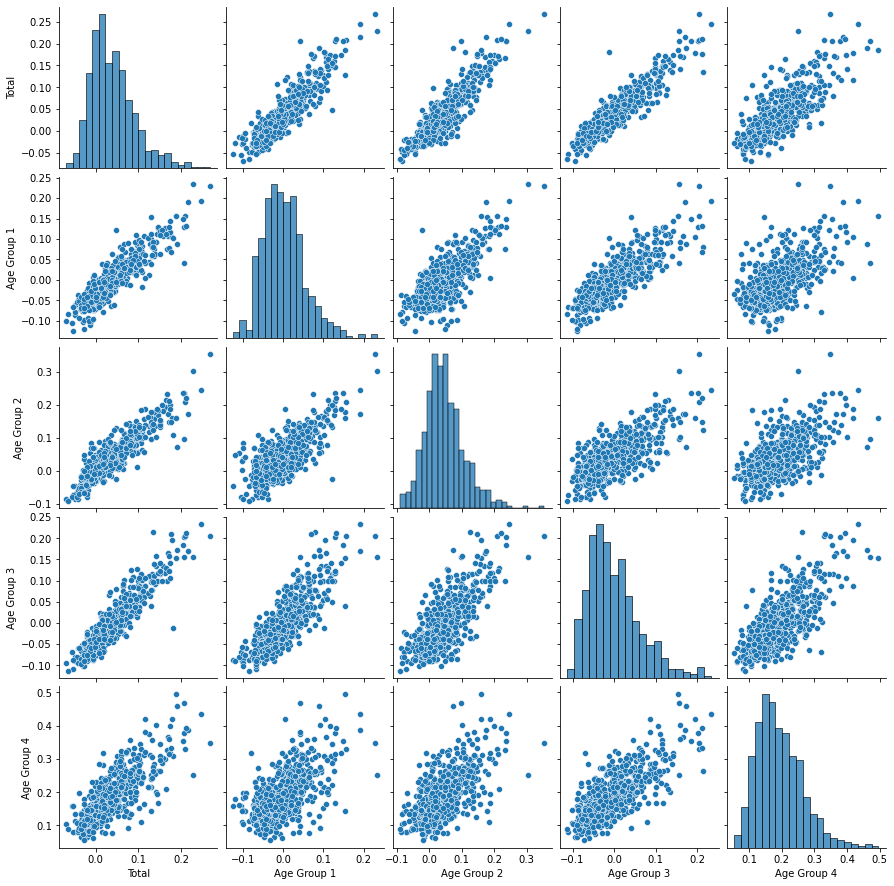

In [72]:
sns.pairplot(super_group_lookback[['Total','Age Group 1','Age Group 2',
                                  'Age Group 3','Age Group 4']])

### Hypothesis 4: Do increases in population levels for counties increase the value of homes? And if so, which types of homes in particular?

I already explored population by age groups above, but here I will study the relationship of total population as well as male vs. female population increases. Again, I will be using a t test.

In [73]:
#splitting the data into two halves based on the median
lower_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Total']<=super_group_lookback['Total'].quantile(0.5)]
upper_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Total']>super_group_lookback['Total'].quantile(0.5)]

lower_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Total']<=super_group_lookback['Total'].quantile(0.5)]
upper_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Total']>super_group_lookback['Total'].quantile(0.5)]

lower_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Total']<=super_group_lookback['Total'].quantile(0.5)]
upper_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Total']>super_group_lookback['Total'].quantile(0.5)]

lower_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Total']<=super_group_lookback['Total'].quantile(0.5)]
upper_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Total']>super_group_lookback['Total'].quantile(0.5)]

In [74]:
#test to see if the mean increase in various ZHVI is significantly greater in the upper half group than the lower half group
#using the 2 sample t test - the two samples and independent since they each include non overlapping counties. Based on the scatterplot 
#matrix above, the variables are roughly normal
test_1br, p_1br = ttest_ind(list(upper_half_1br), list(lower_half_1br),equal_var=False)
test_2br, p_2br = ttest_ind(list(upper_half_2br), list(lower_half_2br),equal_var=False)
test_3br, p_3br = ttest_ind(list(upper_half_3br), list(lower_half_3br),equal_var=False)
test_4br, p_4br = ttest_ind(list(upper_half_4br), list(lower_half_4br),equal_var=False)

In [75]:
print('Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in total population.')
print('T value of '+str(test_1br)+' and a p-value of '+str(p_1br))
print('\n')
print('Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in total population.')
print('T value of '+str(test_2br)+' and a p-value of '+str(p_2br))
print('\n')
print('Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in total population.')
print('T value of '+str(test_3br)+' and a p-value of '+str(p_3br))
print('\n')
print('Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in total population.')
print('T value of '+str(test_4br)+' and a p-value of '+str(p_4br))

Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in total population.
T value of 12.372224557495068 and a p-value of 3.391182444578424e-31


Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in total population.
T value of 14.239878472061516 and a p-value of 1.9646745867879754e-39


Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in total population.
T value of 13.009451718573972 and a p-value of 4.695303191745321e-34


Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in total population.
T value of 10.028894245306727 and a p-value of 6.307747195800634e-22


The t values above suggest that the relationship between total population and house prices is statistically significant. Above median 5 year increases in total population is accompanied by significantly higher home price increases on average compared to counties with below median total popuation increases. The relationship is highest among 2 and 3 bedroom homes.

In [76]:
#splitting the data into two halves based on the median
lower_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Male']<=super_group_lookback['Male'].quantile(0.5)]
upper_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Male']>super_group_lookback['Male'].quantile(0.5)]

lower_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Male']<=super_group_lookback['Male'].quantile(0.5)]
upper_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Male']>super_group_lookback['Male'].quantile(0.5)]

lower_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Male']<=super_group_lookback['Male'].quantile(0.5)]
upper_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Male']>super_group_lookback['Male'].quantile(0.5)]

lower_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Male']<=super_group_lookback['Male'].quantile(0.5)]
upper_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Male']>super_group_lookback['Male'].quantile(0.5)]

In [77]:
#test to see if the mean increase in various ZHVI is significantly greater in the upper half group than the lower half group
#using the 2 sample t test - the two samples and independent since they each include non overlapping counties. Based on the scatterplot 
#matrix above, the variables are roughly normal
test_1br, p_1br = ttest_ind(list(upper_half_1br), list(lower_half_1br),equal_var=False)
test_2br, p_2br = ttest_ind(list(upper_half_2br), list(lower_half_2br),equal_var=False)
test_3br, p_3br = ttest_ind(list(upper_half_3br), list(lower_half_3br),equal_var=False)
test_4br, p_4br = ttest_ind(list(upper_half_4br), list(lower_half_4br),equal_var=False)

In [78]:
print('Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in male population.')
print('T value of '+str(test_1br)+' and a p-value of '+str(p_1br))
print('\n')
print('Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in male population.')
print('T value of '+str(test_2br)+' and a p-value of '+str(p_2br))
print('\n')
print('Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in male population.')
print('T value of '+str(test_3br)+' and a p-value of '+str(p_3br))
print('\n')
print('Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in male population.')
print('T value of '+str(test_4br)+' and a p-value of '+str(p_4br))

Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in male population.
T value of 12.708224428671924 and a p-value of 1.1849213699605563e-32


Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in male population.
T value of 15.017288817372323 and a p-value of 6.102364545916819e-43


Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in male population.
T value of 13.597222173048383 and a p-value of 1.3492588239529514e-36


Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in male population.
T value of 10.468807831053228 and a p-value of 1.4072213655906872e-23


The t values above suggest that the relationship between male population and house prices is statistically significant. Above median 5 year increases in male population is accompanied by significantly higher home price increases on average compared to counties with below median male popuation increases. The relationship is highest among 2 and 3 bedroom homes.

In [79]:
#splitting the data into two halves based on the median
lower_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Female']<=super_group_lookback['Female'].quantile(0.5)]
upper_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Female']>super_group_lookback['Female'].quantile(0.5)]

lower_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Female']<=super_group_lookback['Female'].quantile(0.5)]
upper_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Female']>super_group_lookback['Female'].quantile(0.5)]

lower_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Female']<=super_group_lookback['Female'].quantile(0.5)]
upper_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Female']>super_group_lookback['Female'].quantile(0.5)]

lower_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Female']<=super_group_lookback['Female'].quantile(0.5)]
upper_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Female']>super_group_lookback['Female'].quantile(0.5)]

In [80]:
#test to see if the mean increase in various ZHVI is significantly greater in the upper half group than the lower half group
#using the 2 sample t test - the two samples and independent since they each include non overlapping counties. Based on the scatterplot 
#matrix above, the variables are roughly normal
test_1br, p_1br = ttest_ind(list(upper_half_1br), list(lower_half_1br),equal_var=False)
test_2br, p_2br = ttest_ind(list(upper_half_2br), list(lower_half_2br),equal_var=False)
test_3br, p_3br = ttest_ind(list(upper_half_3br), list(lower_half_3br),equal_var=False)
test_4br, p_4br = ttest_ind(list(upper_half_4br), list(lower_half_4br),equal_var=False)

In [81]:
print('Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in female population.')
print('T value of '+str(test_1br)+' and a p-value of '+str(p_1br))
print('\n')
print('Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in female population.')
print('T value of '+str(test_2br)+' and a p-value of '+str(p_2br))
print('\n')
print('Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in female population.')
print('T value of '+str(test_3br)+' and a p-value of '+str(p_3br))
print('\n')
print('Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in female population.')
print('T value of '+str(test_4br)+' and a p-value of '+str(p_4br))

Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in female population.
T value of 12.263555167339199 and a p-value of 9.909023706626579e-31


Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in female population.
T value of 14.801324363120786 and a p-value of 6.12509710422652e-42


Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in female population.
T value of 13.321286887932144 and a p-value of 2.0454973041763282e-35


Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in female population.
T value of 10.122285665538485 and a p-value of 2.8208792757182353e-22


The t values above suggest that the relationship between female population and house prices is statistically significant. Above median 5 year increases in female population is accompanied by significantly higher home price increases on average compared to counties with below median female popuation increases. The relationship is highest among 2 and 3 bedroom homes.

<b>Overall</b>, population changes has a significant relationship between home price increases. There isn't a noticeable difference between the impact that increases in male vs. female populations have on home price though.

### Hypothesis 5: Do increases in number of property units increase the value of homes around them? If so, which types of homes?

Here I will use the same methodology as in the previous hypothesis, but using the Home Units variable. I will still be using a t test.

In [82]:
#splitting the data into two halves based on the median
lower_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Home Units']<=super_group_lookback['Home Units'].quantile(0.5)]
upper_half_1br = super_group_lookback['1BR ZHVI'][super_group_lookback['Home Units']>super_group_lookback['Home Units'].quantile(0.5)]

lower_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Home Units']<=super_group_lookback['Home Units'].quantile(0.5)]
upper_half_2br = super_group_lookback['2BR ZHVI'][super_group_lookback['Home Units']>super_group_lookback['Home Units'].quantile(0.5)]

lower_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Home Units']<=super_group_lookback['Home Units'].quantile(0.5)]
upper_half_3br = super_group_lookback['3BR ZHVI'][super_group_lookback['Home Units']>super_group_lookback['Home Units'].quantile(0.5)]

lower_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Home Units']<=super_group_lookback['Home Units'].quantile(0.5)]
upper_half_4br = super_group_lookback['4BR ZHVI'][super_group_lookback['Home Units']>super_group_lookback['Home Units'].quantile(0.5)]

In [83]:
#test to see if the mean increase in various ZHVI is significantly greater in the upper half group than the lower half group
#using the 2 sample t test - the two samples and independent since they each include non overlapping counties. Based on the scatterplot 
#matrix above, the variables are roughly normal
test_1br, p_1br = ttest_ind(list(upper_half_1br), list(lower_half_1br),equal_var=False)
test_2br, p_2br = ttest_ind(list(upper_half_2br), list(lower_half_2br),equal_var=False)
test_3br, p_3br = ttest_ind(list(upper_half_3br), list(lower_half_3br),equal_var=False)
test_4br, p_4br = ttest_ind(list(upper_half_4br), list(lower_half_4br),equal_var=False)

In [84]:
print('Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in home units.')
print('T value of '+str(test_1br)+' and a p-value of '+str(p_1br))
print('\n')
print('Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age home units.')
print('T value of '+str(test_2br)+' and a p-value of '+str(p_2br))
print('\n')
print('Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age home units.')
print('T value of '+str(test_3br)+' and a p-value of '+str(p_3br))
print('\n')
print('Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age home units.')
print('T value of '+str(test_4br)+' and a p-value of '+str(p_4br))

Difference in mean 5 year increase in 1 bedroom ZHVI between below and above median 5 year increase in home units.
T value of 7.787479062445554 and a p-value of 3.069505757992171e-14


Difference in mean 5 year increase in 2 bedroom ZHVI between below and above median 5 year increase in age home units.
T value of 9.507568410695027 and a p-value of 4.7636410608631686e-20


Difference in mean 5 year increase in 3 bedroom ZHVI between below and above median 5 year increase in age home units.
T value of 8.423981380624033 and a p-value of 2.6786704116845924e-16


Difference in mean 5 year increase in 4 bedroom ZHVI between below and above median 5 year increase in age home units.
T value of 6.4774313620491615 and a p-value of 1.9386250028705024e-10


Despite the relatively low correlations found in the correlation matrices previously seen in this notebook, the average increase in house prices in counties with an increase in home units above the median value is statistically significantly higher than those counties with a below median increase in home units.

# Modeling

Now that I have explored the hypothesis I was interested in, I would like to fit a linear regression model using the changes in age group population increases and home unit increases as predictor variables in order to predict the change in 2 bedroom home price. I will be using the 5 year look back period because homes are not a liquid asset, so I wouldn't want to buy property with a shorter outlook period than 5 years. Also, the 5 year look back period has yielded the strongest relationships previously in this project.

In [86]:
#earlier I had said I was curious about confounding. I am creating interaction terms to help mitigate the impacts of the possible confounding
super_group_lookback['Age 1_2'] = super_group_lookback['Age Group 1'] * super_group_lookback['Age Group 2']
super_group_lookback['Age 1_3'] = super_group_lookback['Age Group 1'] * super_group_lookback['Age Group 3']
super_group_lookback['Age 1_4'] = super_group_lookback['Age Group 1'] * super_group_lookback['Age Group 4']
super_group_lookback['Age 2_3'] = super_group_lookback['Age Group 2'] * super_group_lookback['Age Group 3']
super_group_lookback['Age 2_4'] = super_group_lookback['Age Group 2'] * super_group_lookback['Age Group 4']
super_group_lookback['Age 3_4'] = super_group_lookback['Age Group 3'] * super_group_lookback['Age Group 4']
super_group_lookback['Age 1_2_3'] = super_group_lookback['Age Group 1'] * super_group_lookback['Age Group 2'] * super_group_lookback['Age Group 3']
super_group_lookback['Age 2_3_4'] = super_group_lookback['Age Group 2'] * super_group_lookback['Age Group 3'] * super_group_lookback['Age Group 4']
super_group_lookback['Age 1_2_4'] = super_group_lookback['Age Group 1'] * super_group_lookback['Age Group 2'] * super_group_lookback['Age Group 4']
super_group_lookback['Age 1_3_4'] = super_group_lookback['Age Group 1'] * super_group_lookback['Age Group 3'] * super_group_lookback['Age Group 4']
super_group_lookback['Age 1_2_3_4'] = super_group_lookback['Age Group 1'] * super_group_lookback['Age Group 2'] * super_group_lookback['Age Group 3'] * super_group_lookback['Age Group 4']

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = v

In [87]:
#first I need to randomly selected a test and training set from the data
random.seed(121220)
test = random.sample(list(super_group_lookback.index),int(super_group_lookback.shape[0]*0.2))
test_set = super_group_lookback.loc[test,:]
train = list(super_group_lookback.index[~super_group_lookback.index.isin(test)])
train_set = super_group_lookback.loc[train,:]

In [88]:
#just to confirm the train + test = full data length
print(len(train)+len(test))
print(super_group_lookback.shape)

613
(613, 82)


In [89]:
#now to buid a model. First it will only contain the interaction terms then I want to see which ones are significant
interaction_terms = ['Age 1_2','Age 1_3', 'Age 1_4', 'Age 2_3', 'Age 2_4', 'Age 3_4', 'Age 1_2_3',
                       'Age 2_3_4', 'Age 1_2_4', 'Age 1_3_4', 'Age 1_2_3_4']
mod1 = sm.OLS(train_set['2BR ZHVI'],train_set[interaction_terms])
res1 = mod1.fit()

In [90]:
print(res1.summary())

                                 OLS Regression Results                                
Dep. Variable:               2BR ZHVI   R-squared (uncentered):                   0.694
Model:                            OLS   Adj. R-squared (uncentered):              0.687
Method:                 Least Squares   F-statistic:                              99.01
Date:                Mon, 14 Dec 2020   Prob (F-statistic):                   7.03e-116
Time:                        15:28:02   Log-Likelihood:                          98.041
No. Observations:                 491   AIC:                                     -174.1
Df Residuals:                     480   BIC:                                     -127.9
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

Almost all of the interactions are significant at the 0.05 alpha level, but I would like to be more picky and use a 0.01 alpha level. Therefore, the only interactions terms to be kept are Age 1_2, Age 1_4, Age 2_3, Age 2_4, Age 1_2_3, Age 2_3_4, and Age 1_2_3_4. Next, I will include all of the different Age features and then see which interaction terms are still significant.

In [91]:
terms = ['Age Group 1','Age Group 2','Age Group 3','Age Group 4','Age 1_2','Age 1_4', 'Age 2_3', 'Age 2_4', 'Age 1_2_3',
                       'Age 2_3_4', 'Age 1_2_3_4']
mod2 = sm.OLS(train_set['2BR ZHVI'],train_set[terms])
res2 = mod2.fit()

In [92]:
print(res2.summary())

                                 OLS Regression Results                                
Dep. Variable:               2BR ZHVI   R-squared (uncentered):                   0.841
Model:                            OLS   Adj. R-squared (uncentered):              0.837
Method:                 Least Squares   F-statistic:                              230.3
Date:                Mon, 14 Dec 2020   Prob (F-statistic):                   1.56e-183
Time:                        15:29:22   Log-Likelihood:                          258.27
No. Observations:                 491   AIC:                                     -494.5
Df Residuals:                     480   BIC:                                     -448.4
Df Model:                          11                                                  
Covariance Type:            nonrobust                                                  
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

The Age Group 1 variable is not statistically significant and neither is Age Group 3. However, these are related to interaction terms still present. Therefore if I removed Age Group 1 and 3, then all associated interaction terms should also be removed, so I will keep them in the model. Also, the interaction between age group 1 and 2 and 1 and 4 is not significant anymore so this will be taken out. Also, now that the age terms have been figure out, I will try adding in the home units variable.

In [93]:
terms2 = ['Home Units','Age Group 1','Age Group 2','Age Group 3','Age Group 4', 'Age 2_3', 'Age 2_4', 'Age 1_2_3',
                       'Age 2_3_4', 'Age 1_2_3_4']

mod3 = sm.OLS(train_set['2BR ZHVI'],train_set[terms2])
res3 = mod3.fit()

In [94]:
print(res3.summary())

                                 OLS Regression Results                                
Dep. Variable:               2BR ZHVI   R-squared (uncentered):                   0.845
Model:                            OLS   Adj. R-squared (uncentered):              0.842
Method:                 Least Squares   F-statistic:                              261.7
Date:                Mon, 14 Dec 2020   Prob (F-statistic):                   2.12e-187
Time:                        15:30:37   Log-Likelihood:                          264.52
No. Observations:                 491   AIC:                                     -509.0
Df Residuals:                     481   BIC:                                     -467.1
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

This is the final model I will selecting. It has an adjusted R-squared of 0.84 which suggests a moderately accurate model (definitely not strong). Now I will quickly look at the residuals to make sure the plot looks alright.

In [95]:
actual = train_set['2BR ZHVI']
predicted = res3.predict(train_set[terms2])

Text(0, 0.5, 'Residuals')

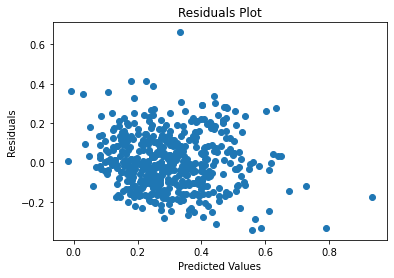

In [96]:
plt.scatter(predicted,actual-predicted)
plt.title('Residuals Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Looking at the residual plot above, there are some high leverage points(bottom right of the cluster of points). It is likely pulling the line of best fit in its direction (not very visible in this residual plot, but you can see a vague downward trend in the residuals), so I will remove high leverage points.

In [97]:
influence = res3.get_influence()
high_leverage = influence.hat_matrix_diag

Text(0, 0.5, 'Leverage Statistic Value')

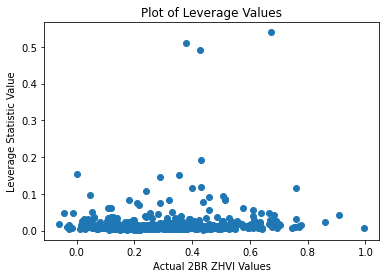

In [98]:
plt.scatter(actual,high_leverage)
plt.title('Plot of Leverage Values')
plt.xlabel('Actual 2BR ZHVI Values')
plt.ylabel('Leverage Statistic Value')

I am making the decision that any point with a leverage statistic over 0.07 will be removed before refitting the model.

In [99]:
to_remove_indices = list(pd.Series(high_leverage)[high_leverage>0.07].index)

In [100]:
train_set_noleverage = train_set.drop(train_set.index[to_remove_indices])

In [101]:
mod4 = sm.OLS(train_set_noleverage['2BR ZHVI'],train_set_noleverage[terms2])
res4 = mod4.fit()

In [102]:
print(res4.summary())

                                 OLS Regression Results                                
Dep. Variable:               2BR ZHVI   R-squared (uncentered):                   0.848
Model:                            OLS   Adj. R-squared (uncentered):              0.845
Method:                 Least Squares   F-statistic:                              257.0
Date:                Mon, 14 Dec 2020   Prob (F-statistic):                   3.22e-181
Time:                        15:32:33   Log-Likelihood:                          262.05
No. Observations:                 470   AIC:                                     -504.1
Df Residuals:                     460   BIC:                                     -462.6
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                  coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

In [103]:
actual2 = train_set_noleverage['2BR ZHVI']
predicted2 = res4.predict(train_set_noleverage[terms2])

Text(0, 0.5, 'Residuals')

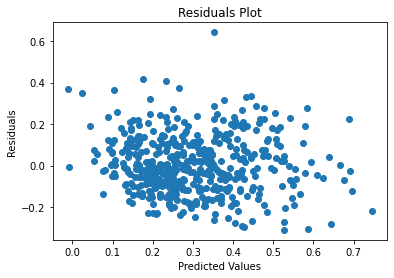

In [104]:
plt.scatter(predicted2,actual2-predicted2)
plt.title('Residuals Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

The residual plot looks pretty good now, and also looking at the model summary I see that the adjusted r-squared increased slightly. That tells me that the line of best fit has been pulled back in the right direction from the removal of the high leverage points.

## Test the Model

Text(0, 0.5, 'Residuals')

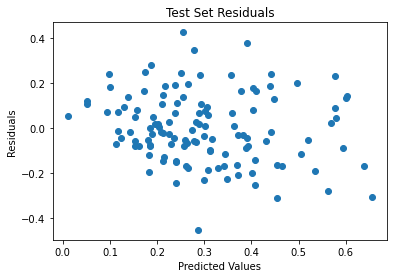

In [105]:
test_pred = res4.predict(test_set[terms2])
test_actual = test_set['2BR ZHVI']
plt.scatter(test_pred,test_actual-test_pred)
plt.title('Test Set Residuals')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')

Over all the test residuals look pretty reasonable. Although some of the residuals are slightly higher than in the training set residuals. Overall, it seems like this model generalizes relatively well to new data. 

## Show future predictions on the map of the US

Now I would like to make a huge assumption that the counties studied in this model will continue their increases shown over the past 5 years in populations and home units. Using these estimated 5 year changes in the various population variables and the home units variables, I will make predictions for what the 5 year 2BR ZHVI increases will be to get a sense of where I should start focusing my energy for researching investment properties. This is a huge assumption to make for estimate the input variables (especially during COVID), so I will make the estimates for the input variables and then decrease them by 25% to get more conservative estimates.

In [163]:
#gatherig the 1 year differences in the variables
past_1_year_changes = look_back_dfs[1]
past_1_year_changes = past_1_year_changes[past_1_year_changes.index.isin(group_counties)]

In [164]:
#making estimates for the input variables
future_inputs = past_1_year_changes*5*0.75
#but the Lat and Lon need to be kept the same
future_inputs['Lat'] = future_inputs['Lat']*1/0.75*1/5
future_inputs['Lon'] = future_inputs['Lon']*1/0.75*1/5

In [165]:
#creating the interaction terms
future_inputs['Age 1_2'] = future_inputs['Age Group 1'] * future_inputs['Age Group 2']
future_inputs['Age 1_3'] = future_inputs['Age Group 1'] * future_inputs['Age Group 3']
future_inputs['Age 1_4'] = future_inputs['Age Group 1'] * future_inputs['Age Group 4']
future_inputs['Age 2_3'] = future_inputs['Age Group 2'] * future_inputs['Age Group 3']
future_inputs['Age 2_4'] = future_inputs['Age Group 2'] * future_inputs['Age Group 4']
future_inputs['Age 3_4'] = future_inputs['Age Group 3'] * future_inputs['Age Group 4']
future_inputs['Age 1_2_3'] = future_inputs['Age Group 1'] * future_inputs['Age Group 2'] * future_inputs['Age Group 3']
future_inputs['Age 2_3_4'] = future_inputs['Age Group 2'] * future_inputs['Age Group 3'] * future_inputs['Age Group 4']
future_inputs['Age 1_2_4'] = future_inputs['Age Group 1'] * future_inputs['Age Group 2'] * future_inputs['Age Group 4']
future_inputs['Age 1_3_4'] = future_inputs['Age Group 1'] * future_inputs['Age Group 3'] * future_inputs['Age Group 4']
future_inputs['Age 1_2_3_4'] = future_inputs['Age Group 1'] * future_inputs['Age Group 2'] * future_inputs['Age Group 3'] * future_inputs['Age Group 4']

In [166]:
#making the predictions
all_predicted = res4.predict(future_inputs[terms2])

C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:27: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 
C:\Users\david\Anaconda3\lib\site-packages\ipykernel_launcher.py:30: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations. 


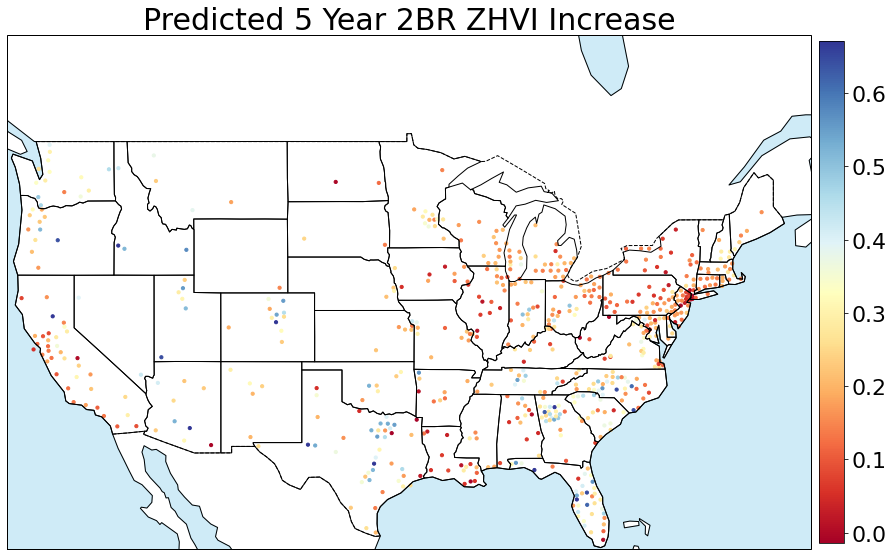

In [169]:
fig, ax = plt.subplots(1, figsize=(15,15),subplot_kw={'projection': crs.Mercator()})


ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND, color="white", alpha=0.5)
ax.add_feature(cfeature.BORDERS, linestyle="--")
ax.add_feature(cfeature.OCEAN, color="skyblue", alpha=0.4)

ax.add_feature(cfeature.STATES)

ax.set_extent([-125, -65, 25, 50])

ax.axis('off')

cm = plt.cm.get_cmap('RdYlBu')

sc = ax.scatter(future_inputs['Lon'], future_inputs['Lat'], 10, marker='o', c=cutOffOutliers(all_predicted,0.01,0.99),
                 cmap=cm,transform=crs.PlateCarree())
cbar = plt.colorbar(sc, ax = ax,fraction=0.03, pad=0.01)

for t in cbar.ax.get_yticklabels():
     t.set_fontsize(22)

ax.set_title('Predicted 5 Year 2BR ZHVI Increase',fontsize=30)

subfig = ax.get_figure()
subfig.tight_layout()
subfig.subplots_adjust(top=0.65)

fig.tight_layout()

The map above suggests that some of the hotspots may be eastern Texas, Atlanta GA, and parts of Florida and North Carolina. In particular I am interested in Texas because of all the talk from companies moving from California to Texas. This should bring more young people and middle aged people to Texas for jobs. Also, the new jobs would likely spur more home units. These factors, in addition to this model predicting the home values to increase in eastern Texas makes it a great spot to research investment properties in.